In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_val_score

from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.metrics import ConfusionMatrixDisplay,accuracy_score
from sklearn.metrics import classification_report

%pip install shap
%pip install catboost
import shap
import catboost
from catboost import CatBoostClassifier, Pool

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 10.7 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 MB 9.8 MB/s eta 0:00:00


# SHAP on Different NASA Datasets

Size of Dataset (2109, 22)
Accuracy:83.784715 %


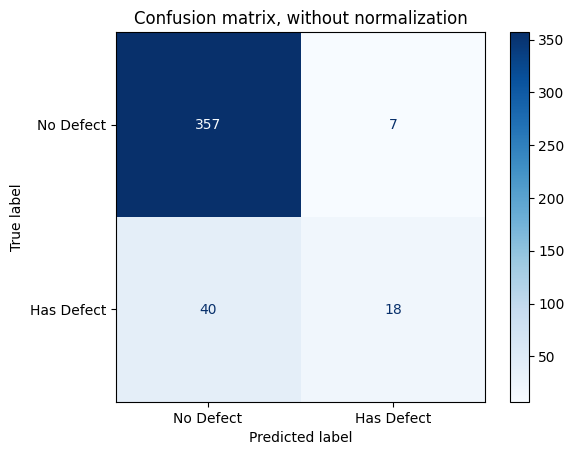

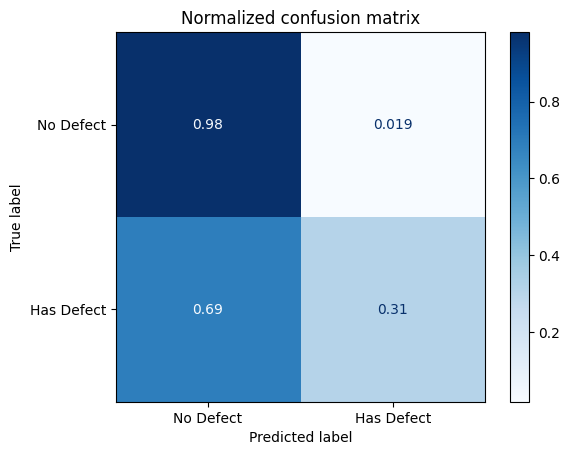

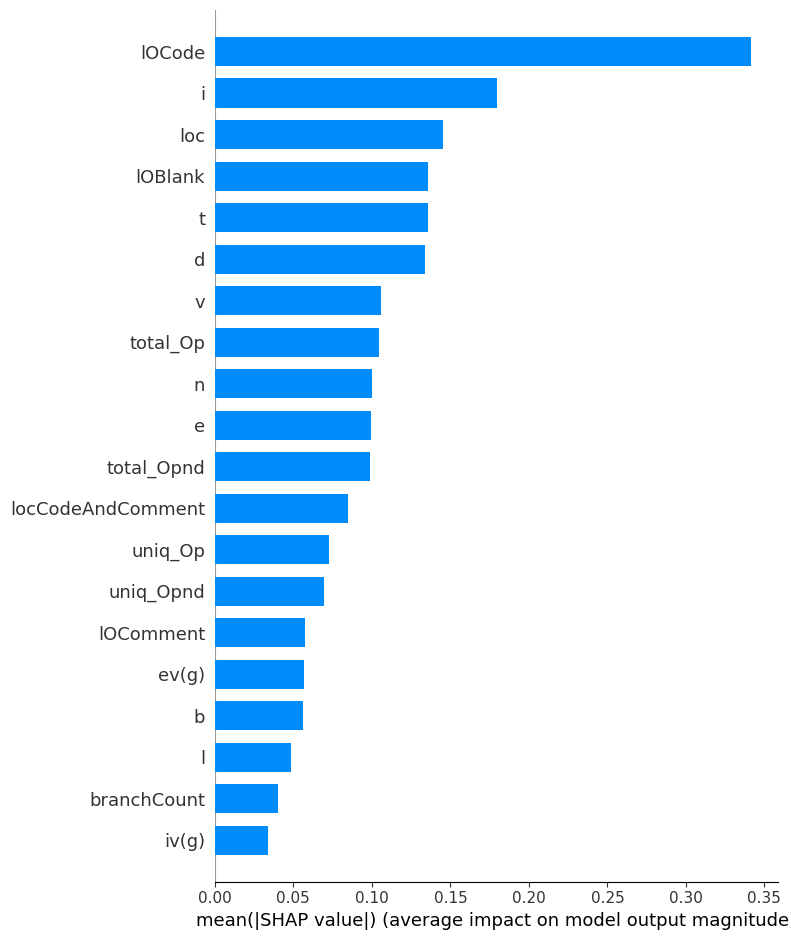

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


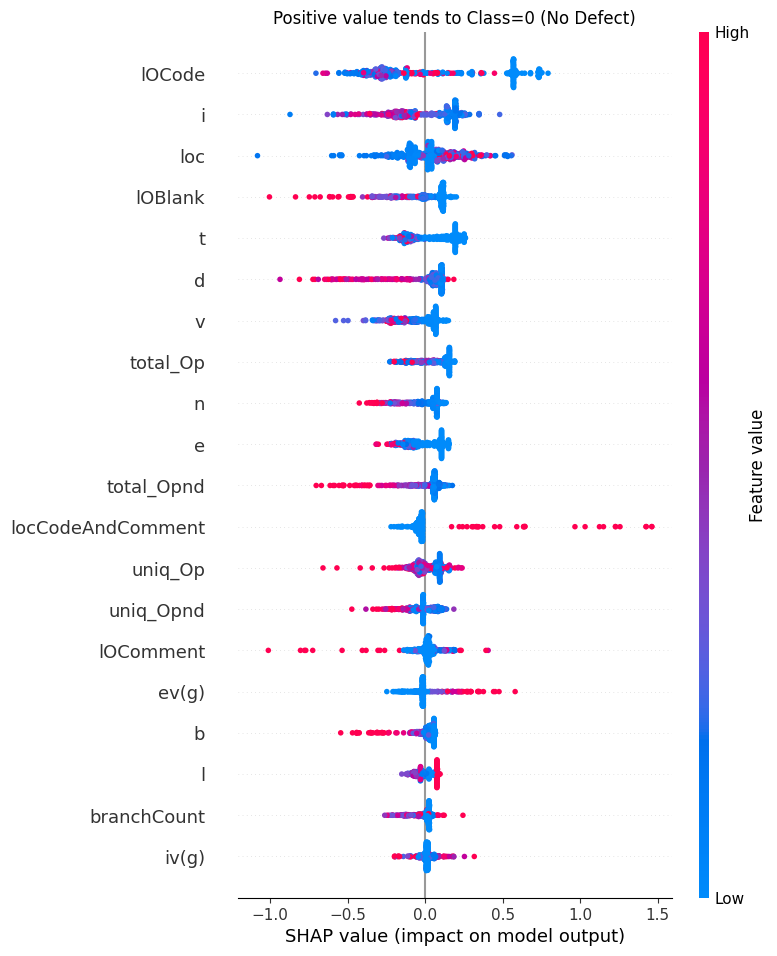

In [79]:
df = pd.read_csv("kc1.csv")
df.columns = df.columns.str.replace('defects', 'c')
df['c'] = df['c'].astype(int)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


Size of Dataset (522, 22)
Accuracy:81.782051 %


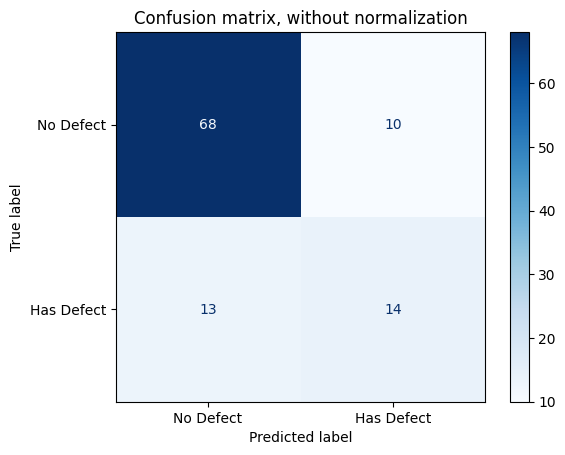

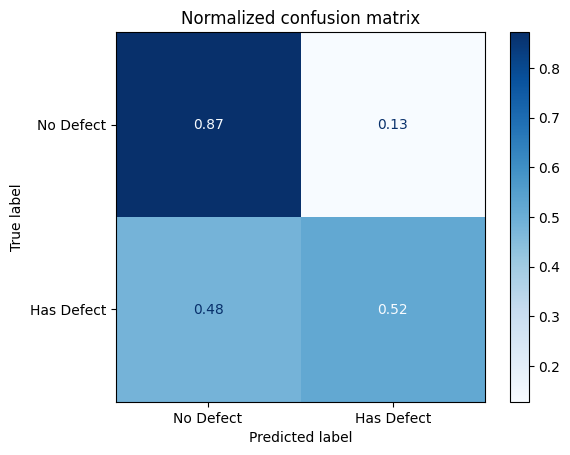

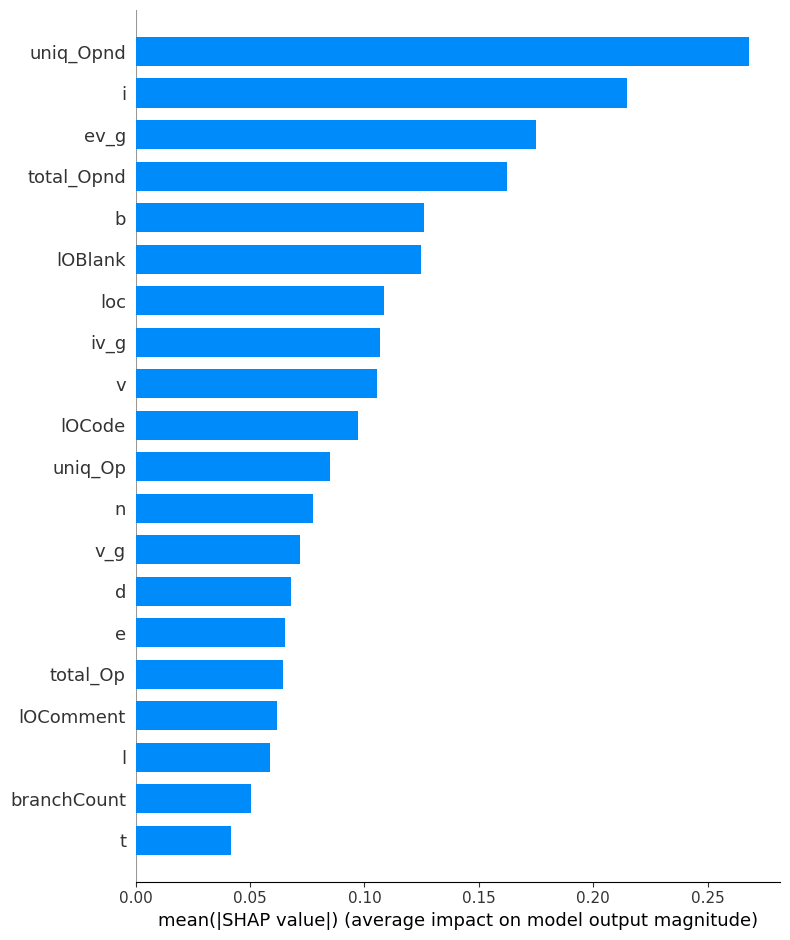

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


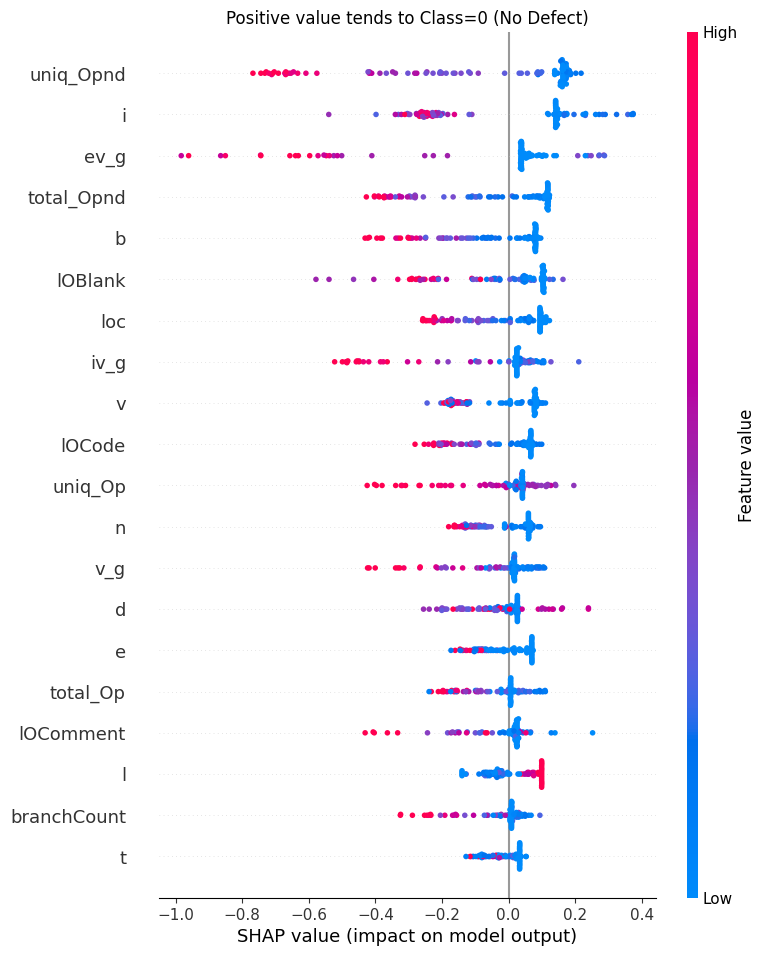

In [81]:
df = pd.read_csv("kc2.csv")
df.columns = df.columns.str.replace('problems', 'c')
df['c'] = df['c'].replace("yes", 1)
df['c'] = df['c'].replace("no", 0)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


Size of Dataset (194, 40)
Accuracy:83.522267 %


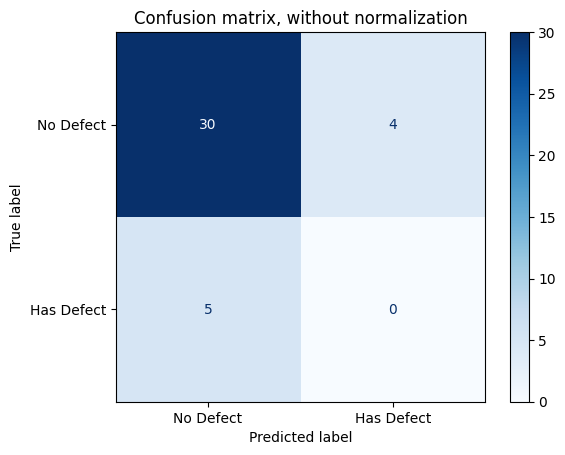

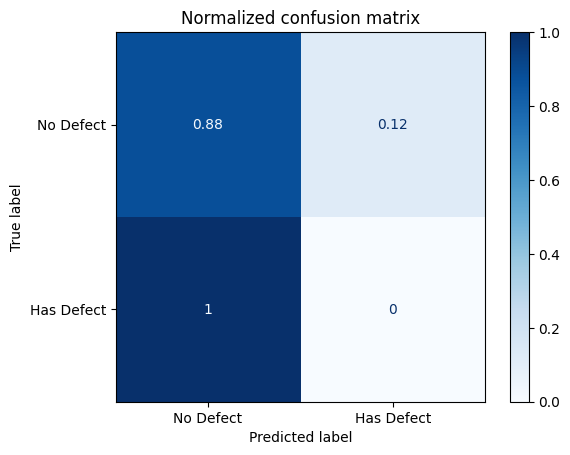

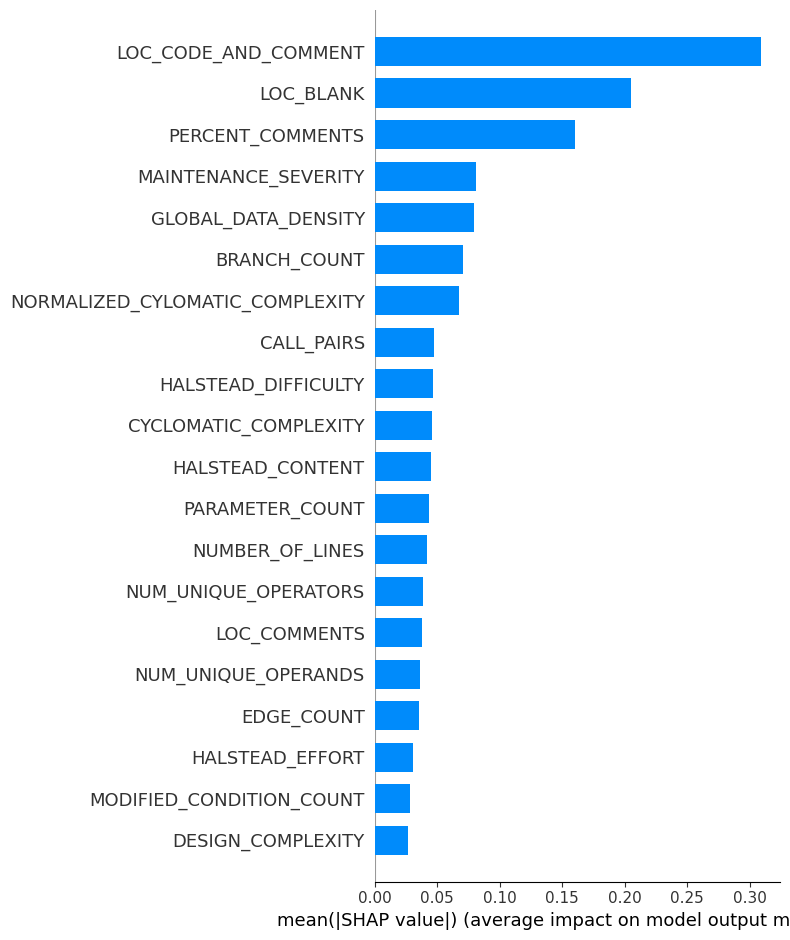

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


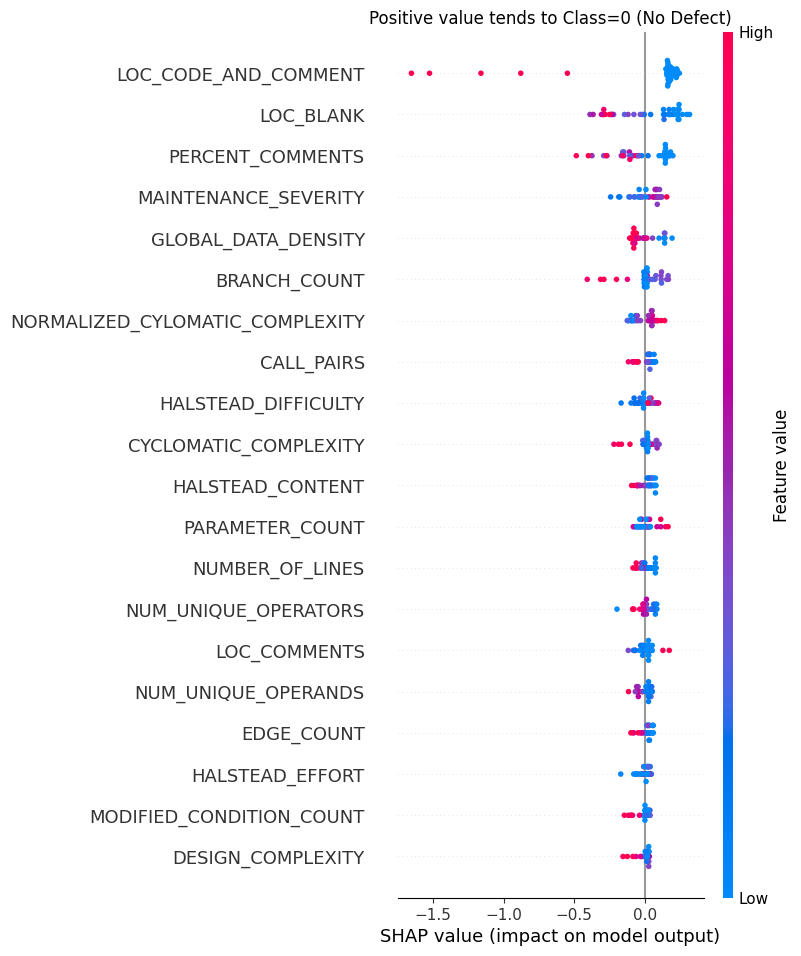

In [82]:
df = pd.read_csv("kc3.csv")
df.columns = df.columns.str.replace('Defective', 'c')
df['c'] = df['c'].replace("Y", 1)
df['c'] = df['c'].replace("N", 0)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


Size of Dataset (7782, 22)
Accuracy:79.208401 %


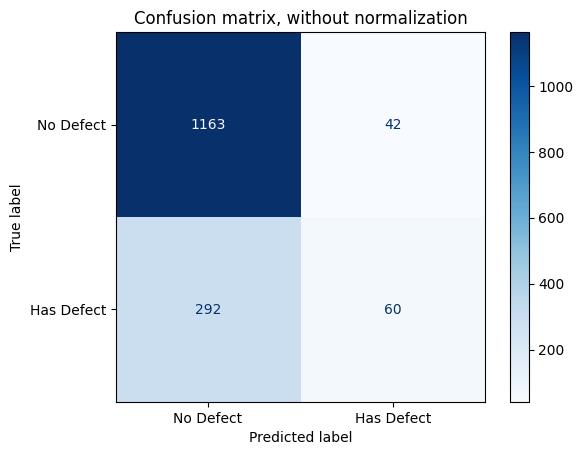

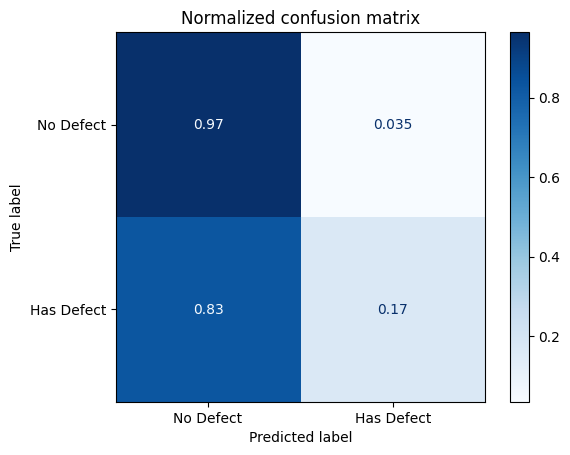

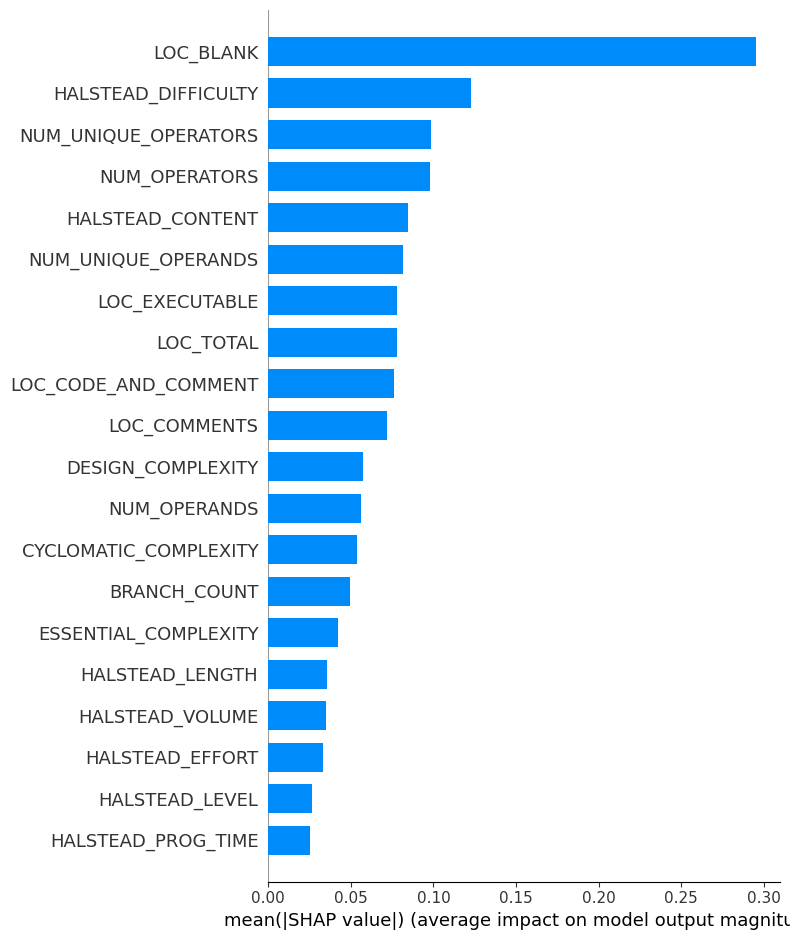

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


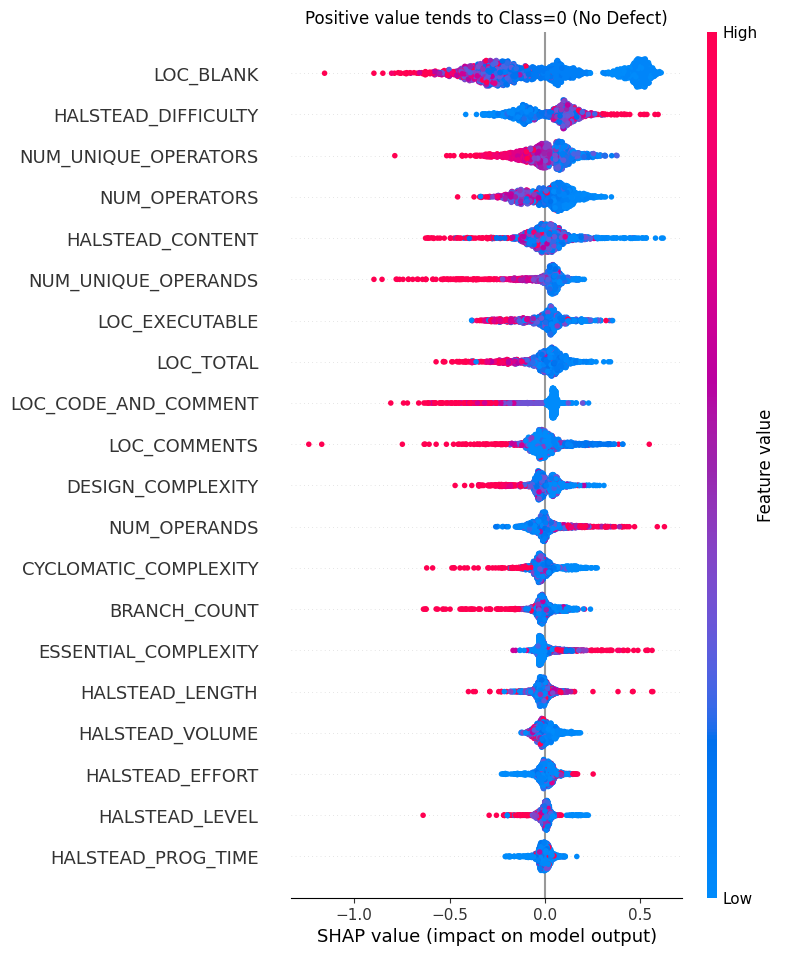

In [80]:
df = pd.read_csv("JM1.csv")
df.columns = df.columns.str.replace('label', 'c')
df['c'] = df['c'].replace("N", 0)
df['c'] = df['c'].replace("Y", 1)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


Size of Dataset (1988, 39)
Accuracy:97.987798 %


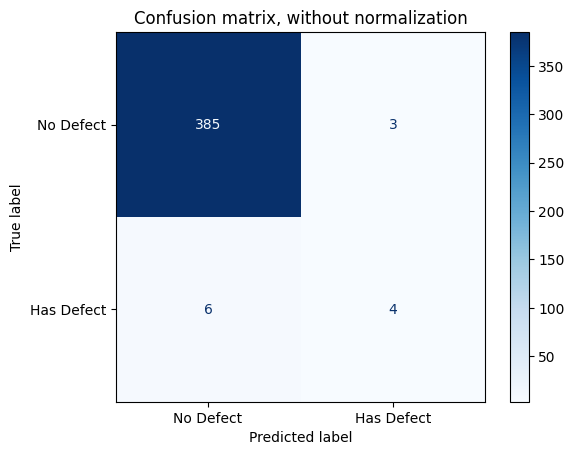

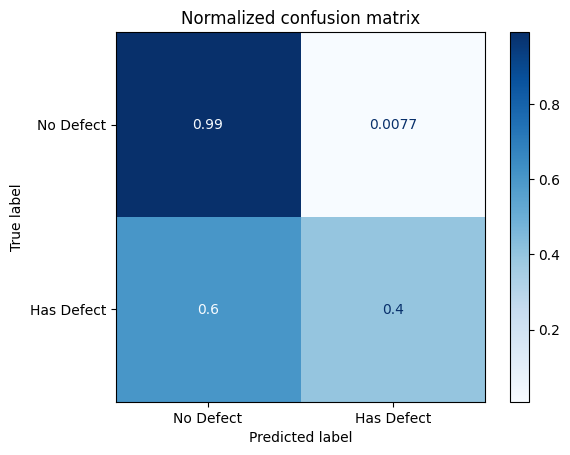

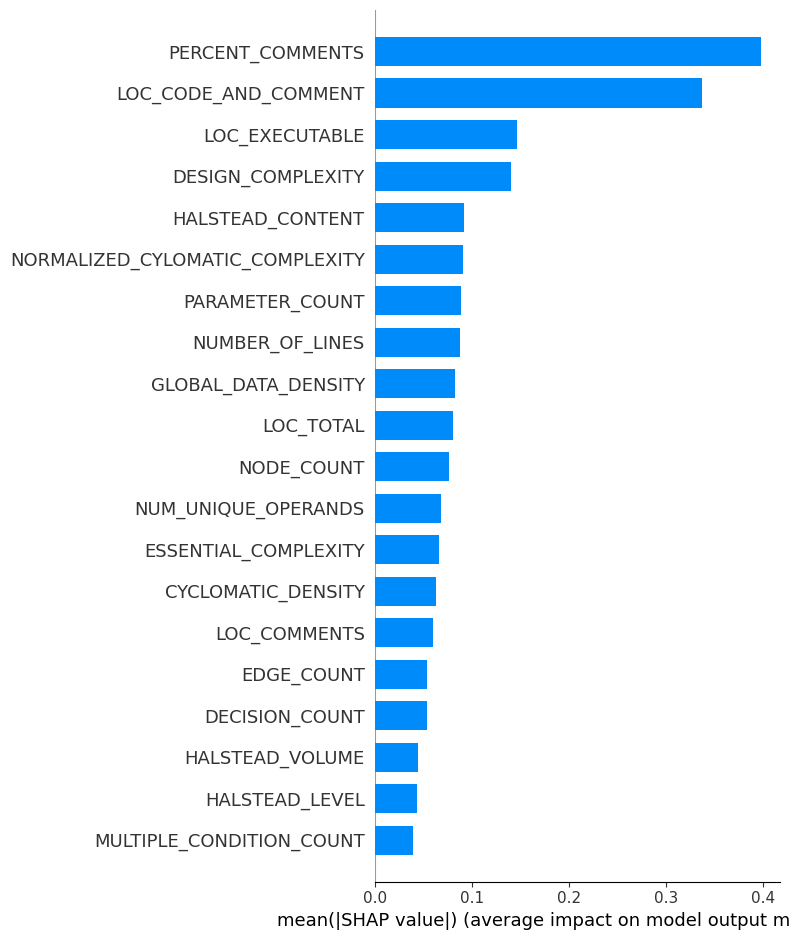

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


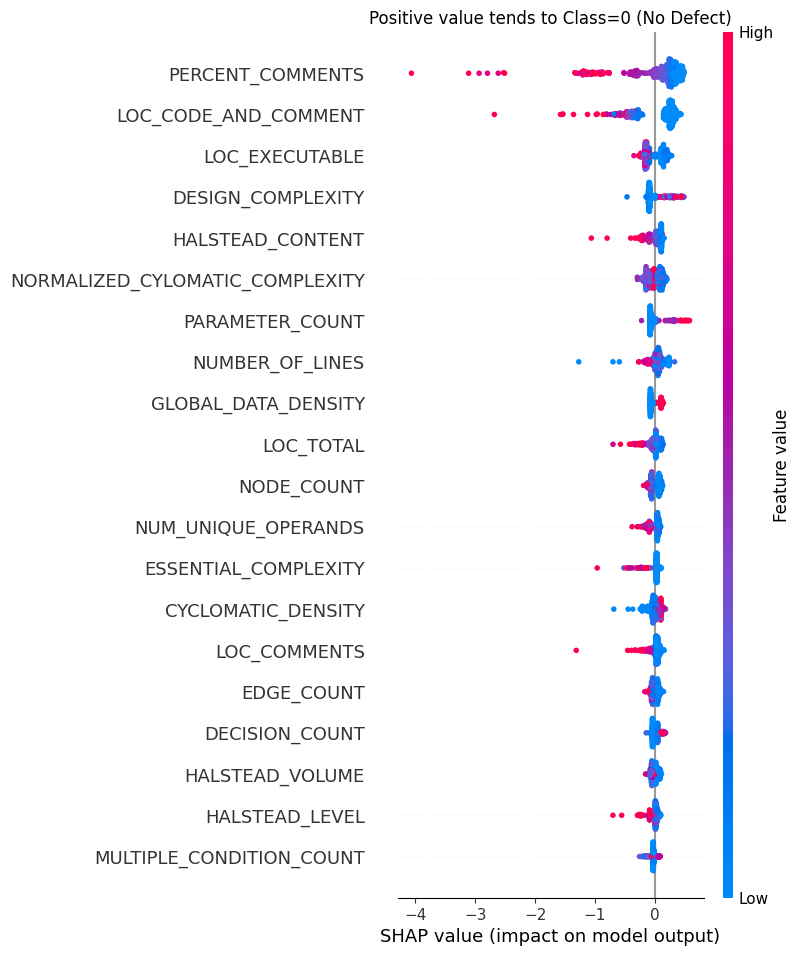

In [83]:
df = pd.read_csv("MC1.csv")
df.columns = df.columns.str.replace('Defective', 'c')
df['c'] = df['c'].replace("Y", 1)
df['c'] = df['c'].replace("N", 0)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


Size of Dataset (125, 40)
Accuracy:72.800000 %


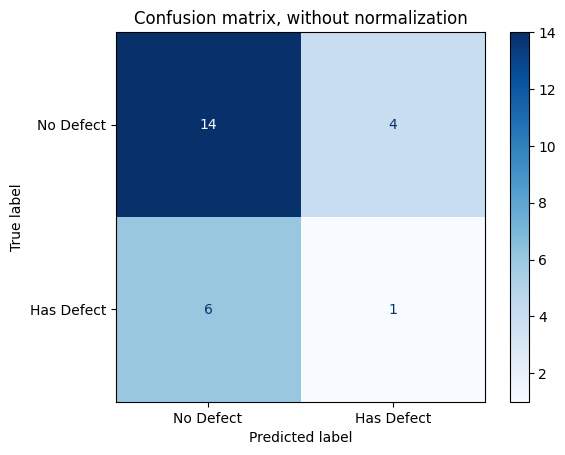

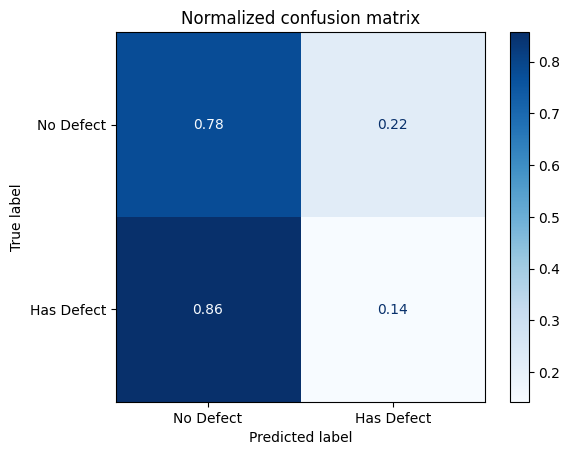

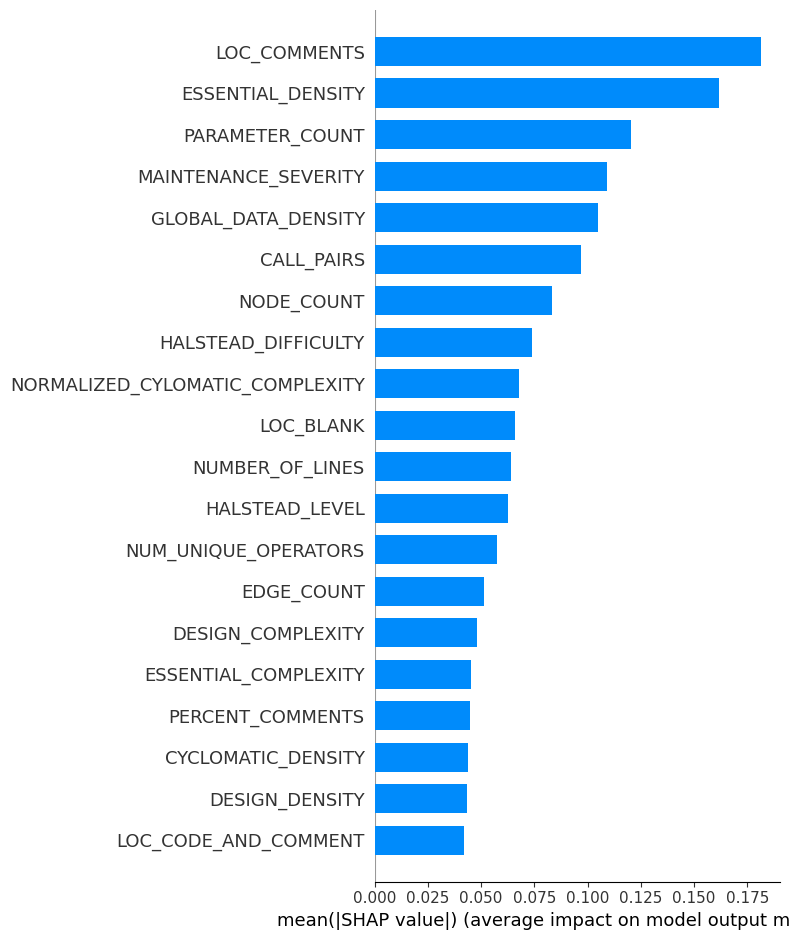

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


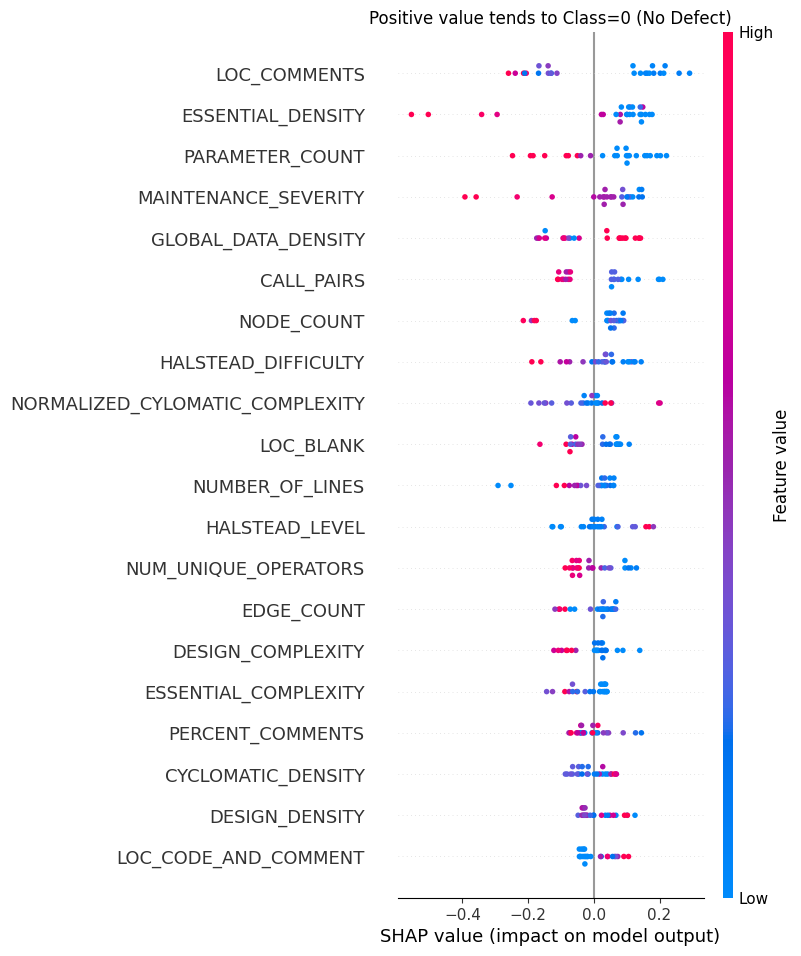

In [84]:
df = pd.read_csv("MC2.csv")
df.columns = df.columns.str.replace('Defective', 'c')
df['c'] = df['c'].replace("Y", 1)
df['c'] = df['c'].replace("N", 0)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


Size of Dataset (253, 38)
Accuracy:87.341176 %


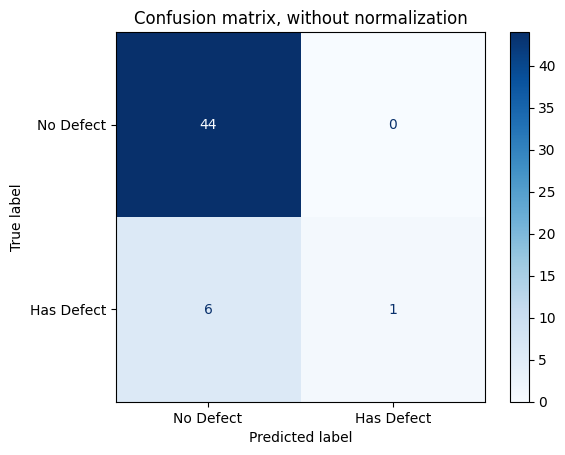

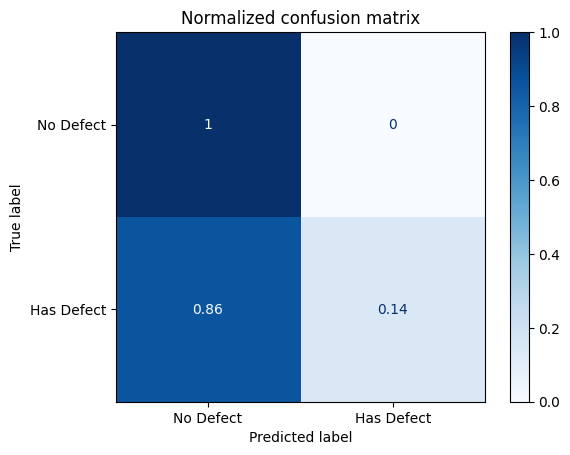

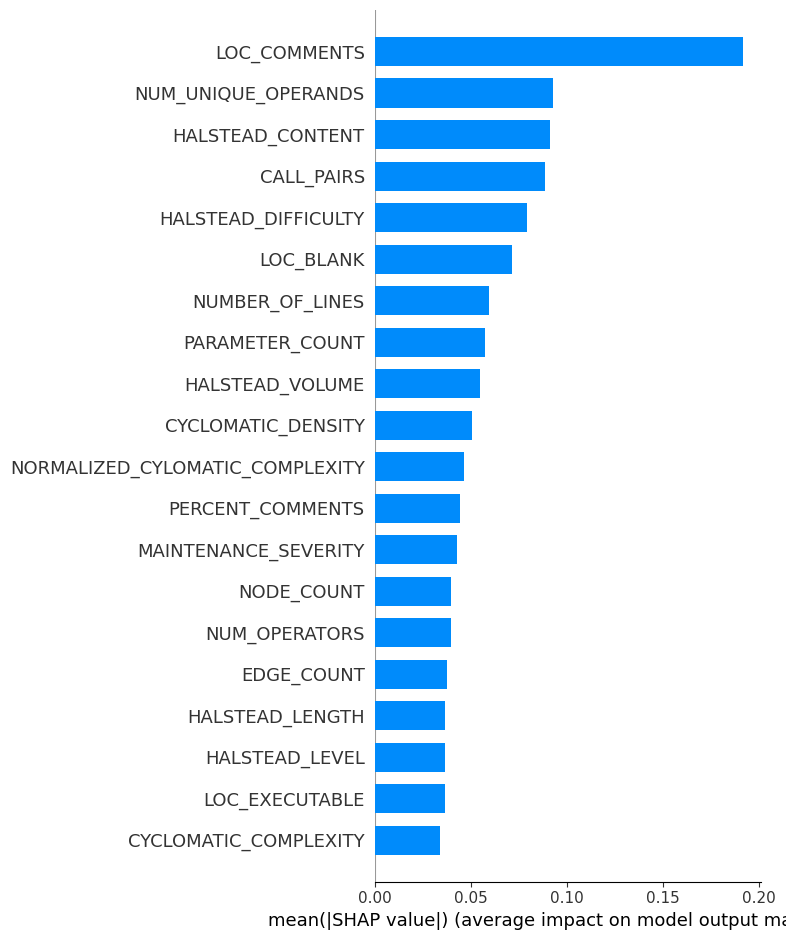

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


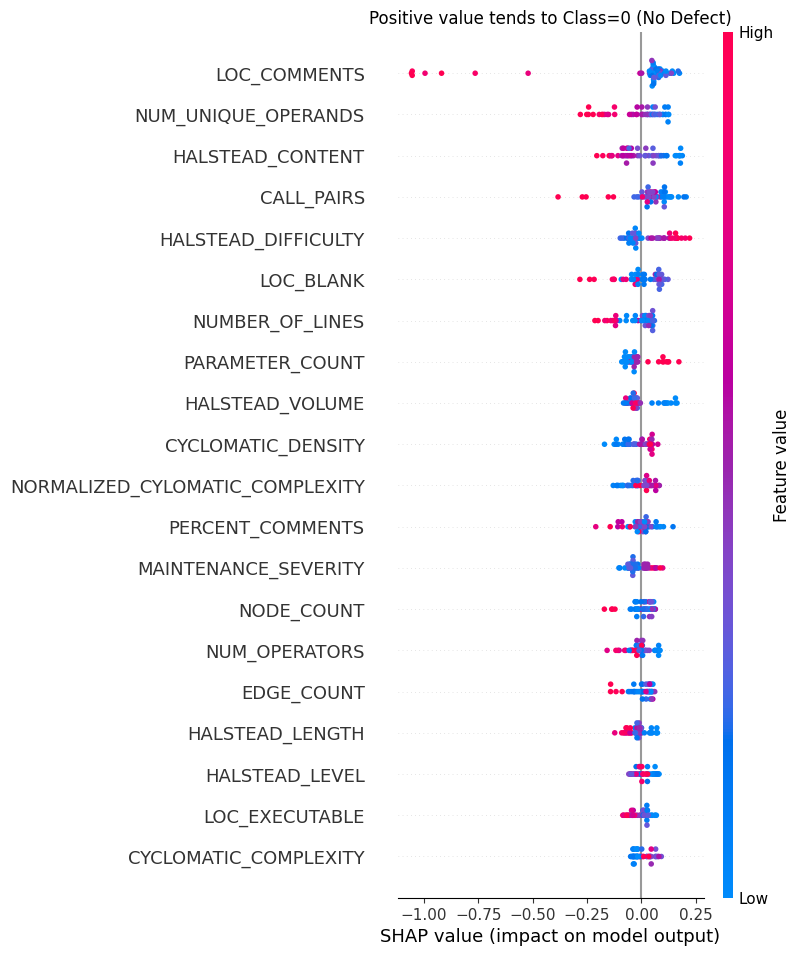

In [85]:
df = pd.read_csv("MW1.csv")
df.columns = df.columns.str.replace('Defective', 'c')
df['c'] = df['c'].replace("Y", 1)
df['c'] = df['c'].replace("N", 0)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


Size of Dataset (705, 38)
Accuracy:91.347518 %


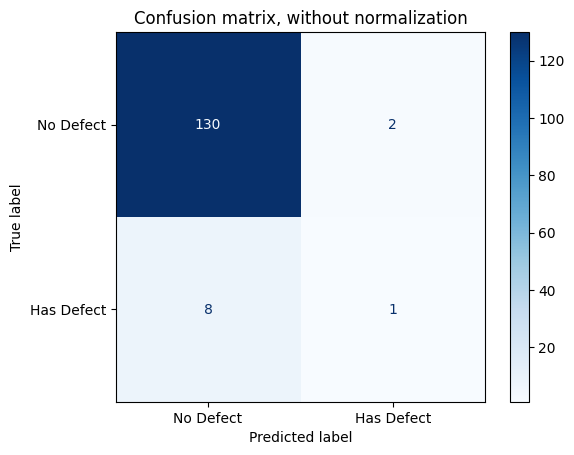

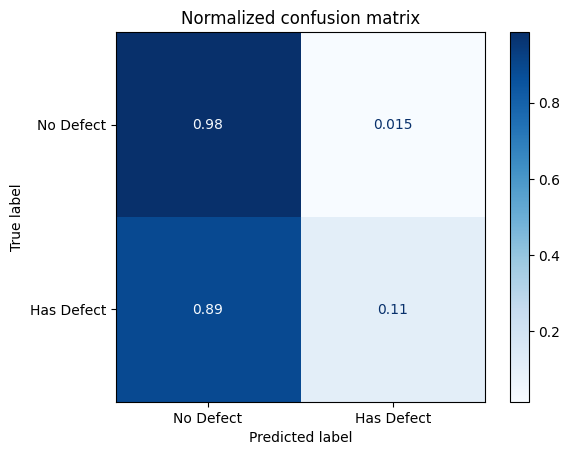

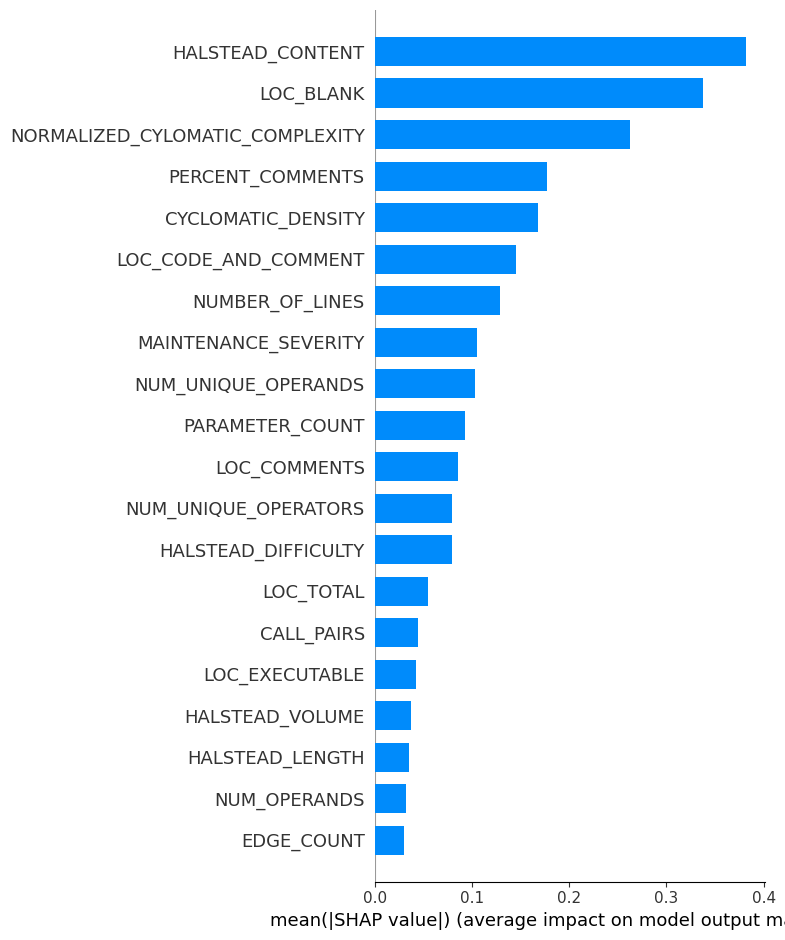

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


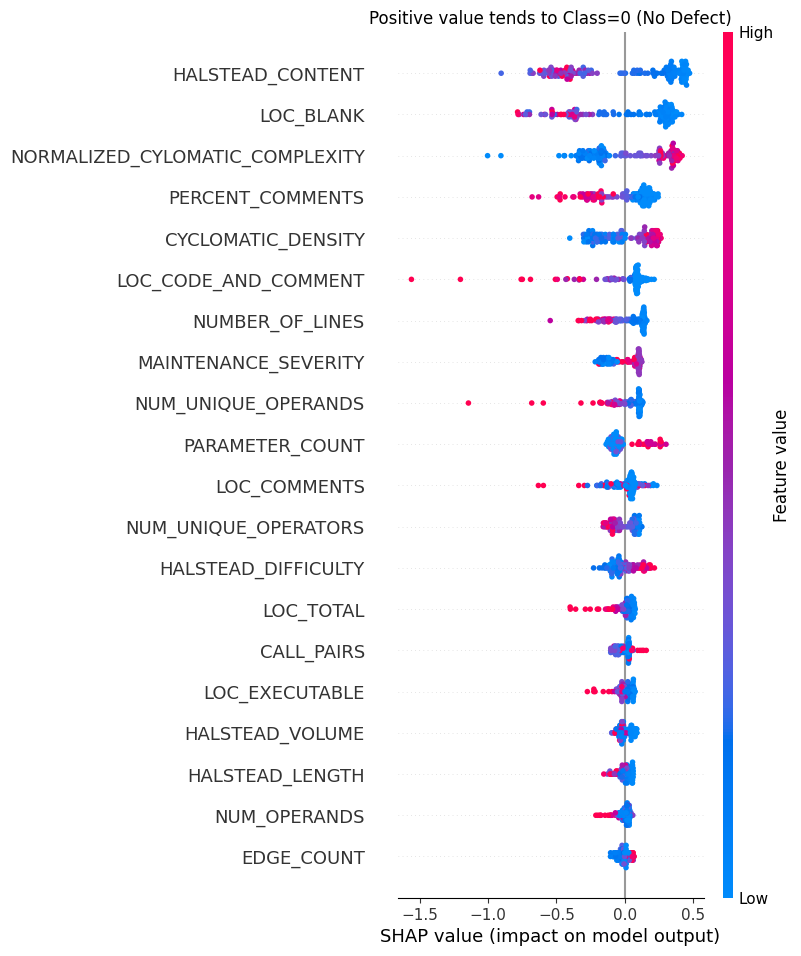

In [86]:
df = pd.read_csv("PC1.csv")
df.columns = df.columns.str.replace('Defective', 'c')
df['c'] = df['c'].replace("Y", 1)
df['c'] = df['c'].replace("N", 0)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


Size of Dataset (745, 37)
Accuracy:97.449664 %


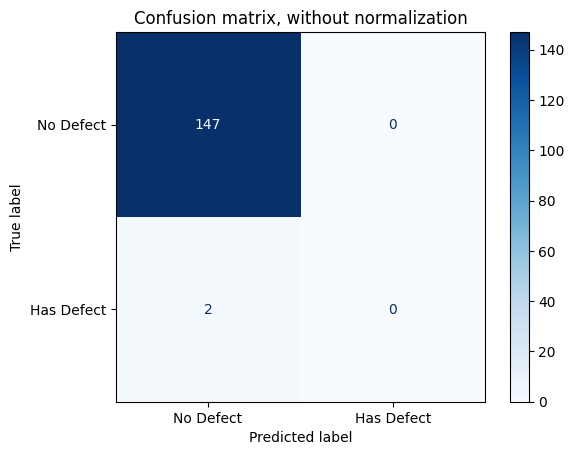

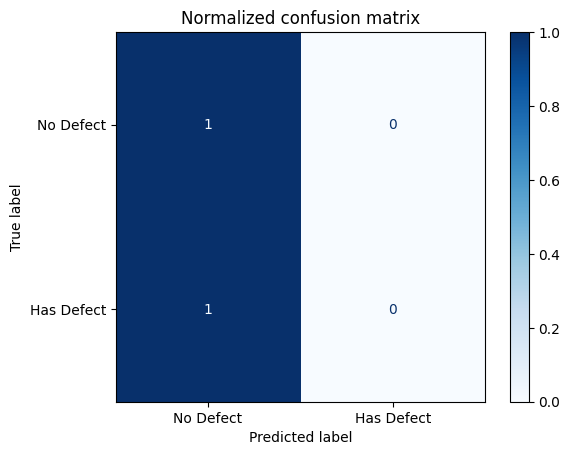

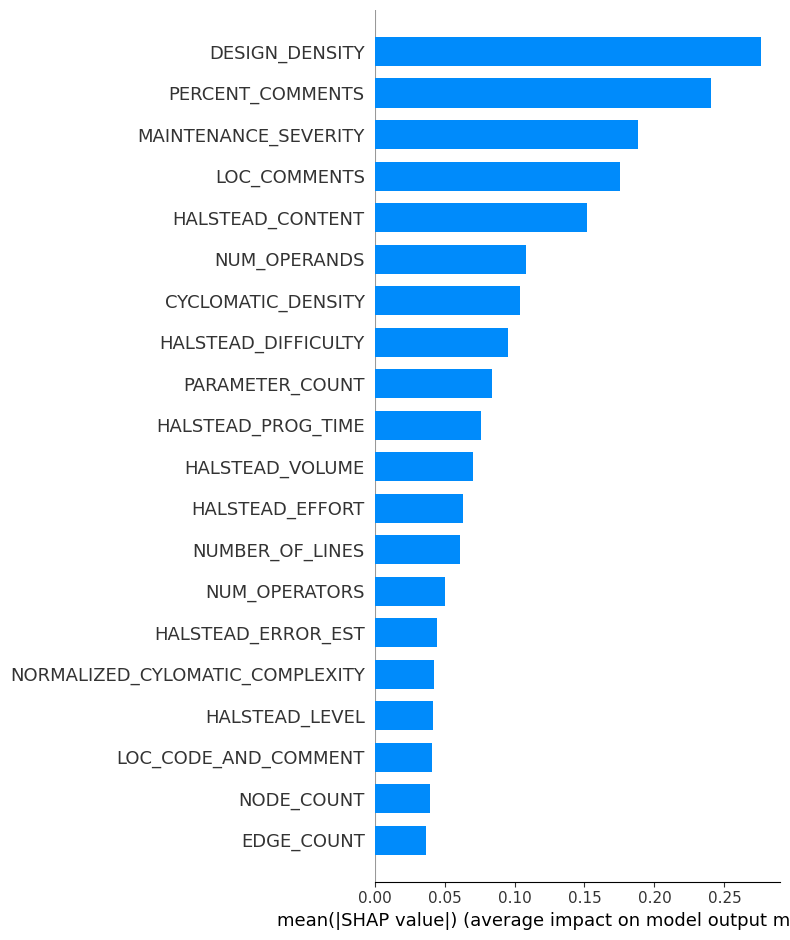

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


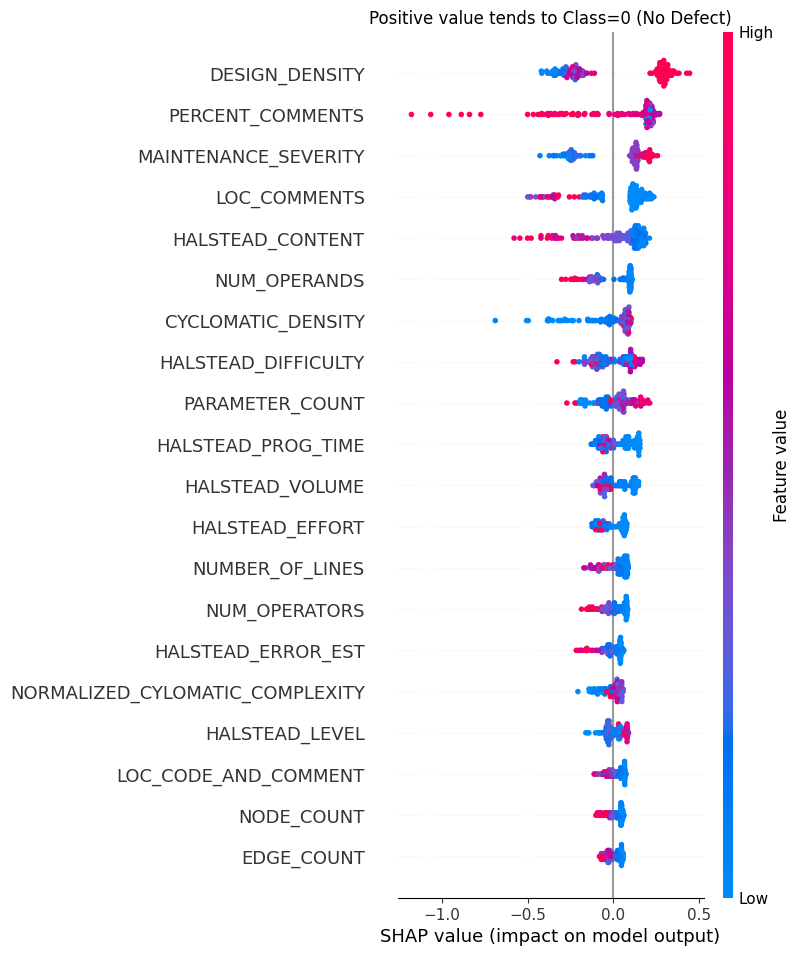

In [87]:
df = pd.read_csv("PC2.csv")
df.columns = df.columns.str.replace('Defective', 'c')
df['c'] = df['c'].replace("Y", 1)
df['c'] = df['c'].replace("N", 0)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


Size of Dataset (1077, 38)
Accuracy:87.186908 %


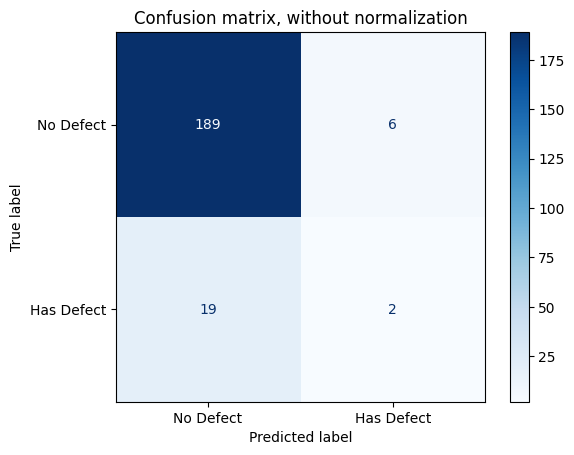

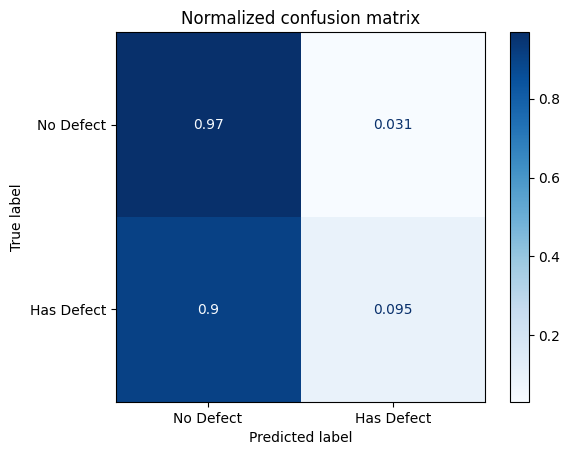

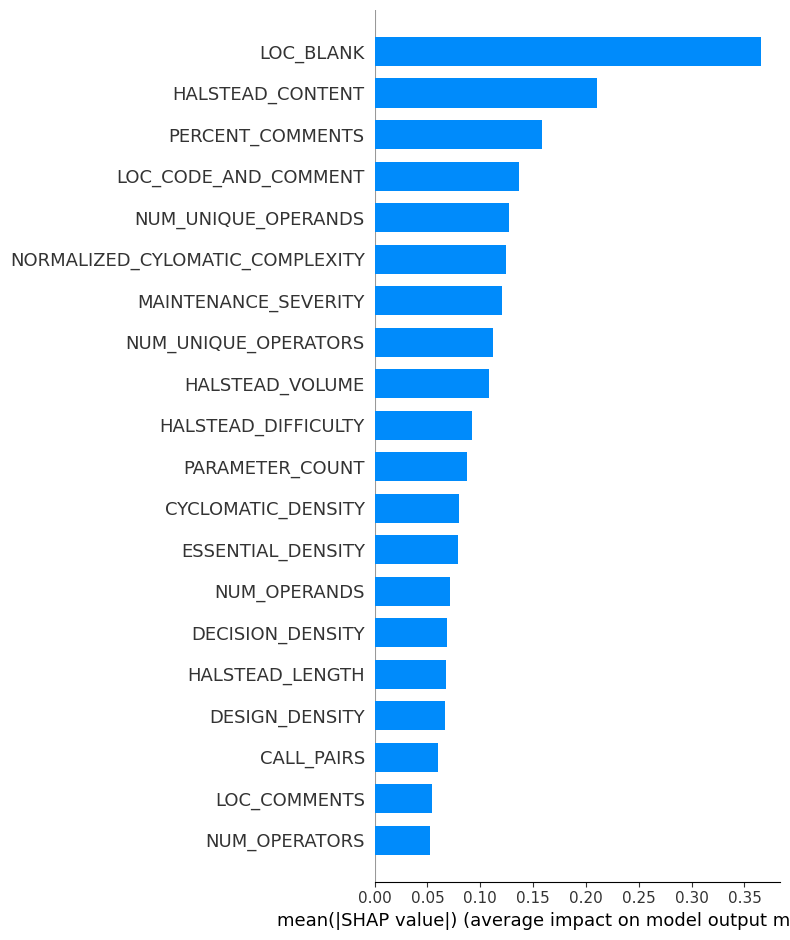

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


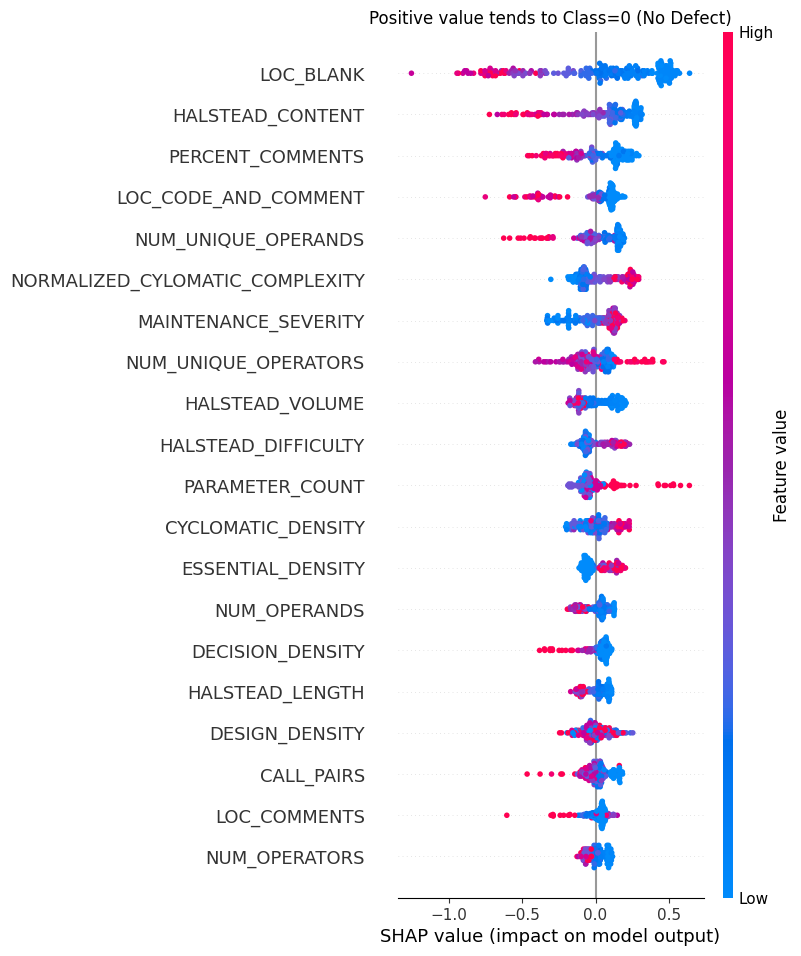

In [88]:
df = pd.read_csv("PC3.csv")
df.columns = df.columns.str.replace('Defective', 'c')
df['c'] = df['c'].replace("Y", 1)
df['c'] = df['c'].replace("N", 0)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


Size of Dataset (1287, 38)
Accuracy:90.132718 %


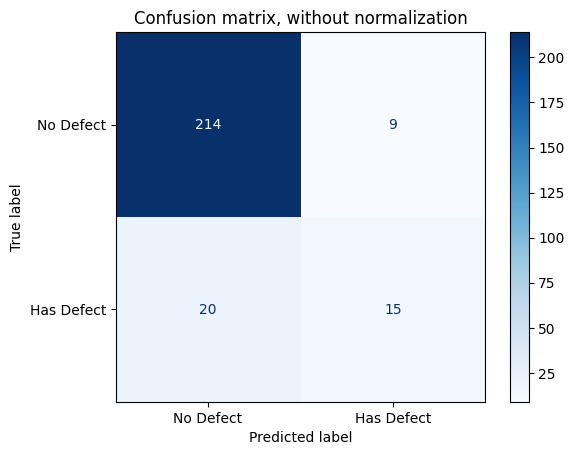

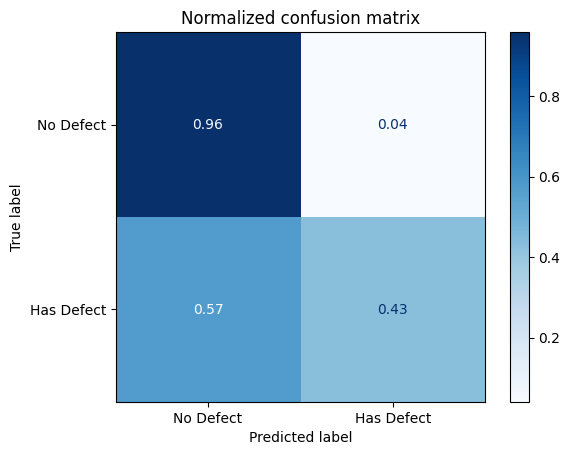

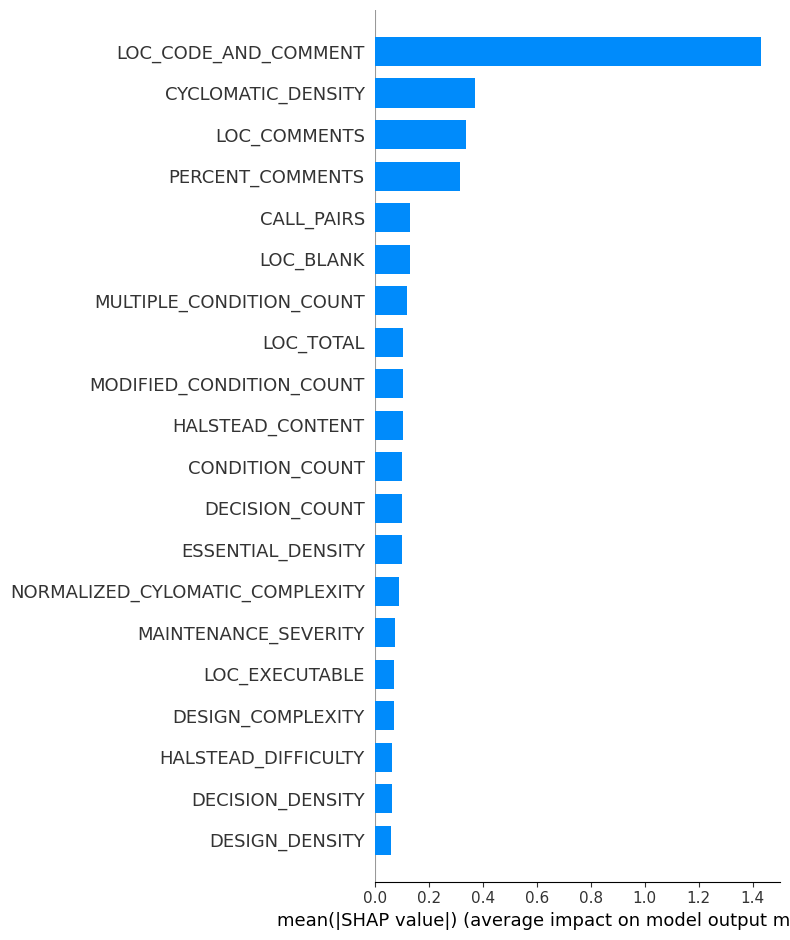

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


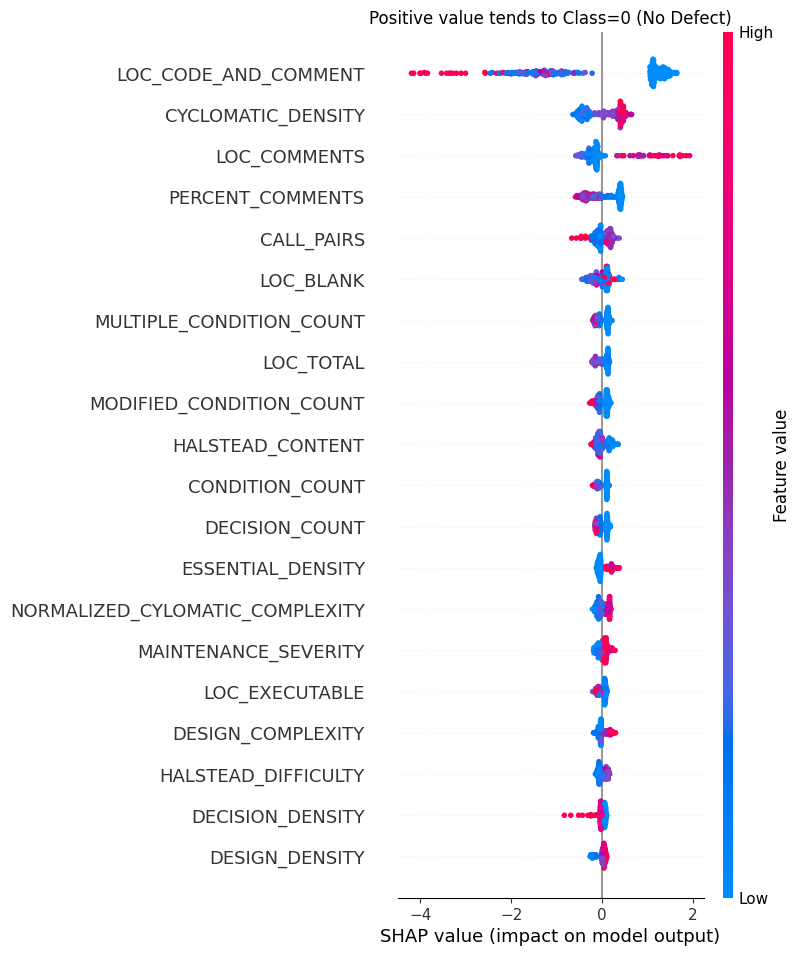

In [89]:
df = pd.read_csv("PC4.csv")
df.columns = df.columns.str.replace('Defective', 'c')
df['c'] = df['c'].replace("Y", 1)
df['c'] = df['c'].replace("N", 0)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


Size of Dataset (1711, 39)
Accuracy:78.082281 %


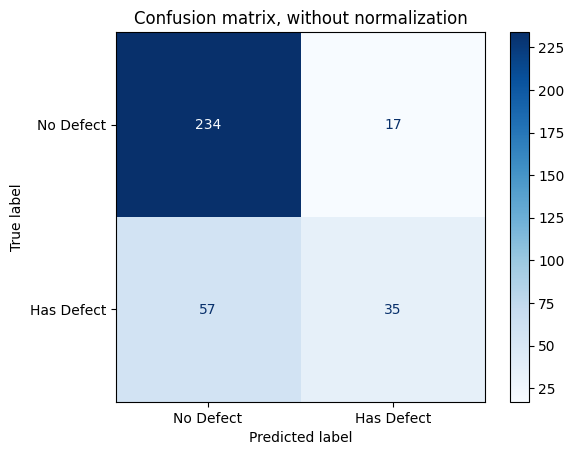

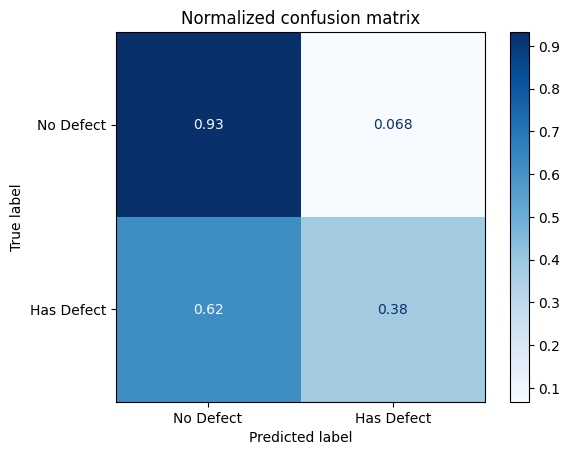

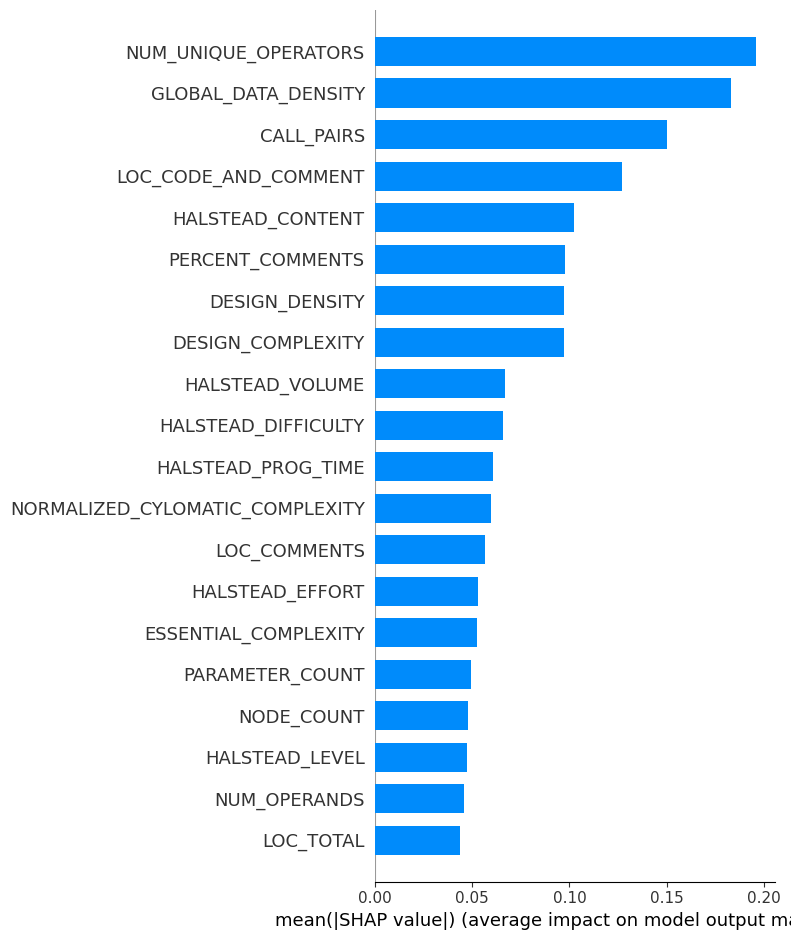

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


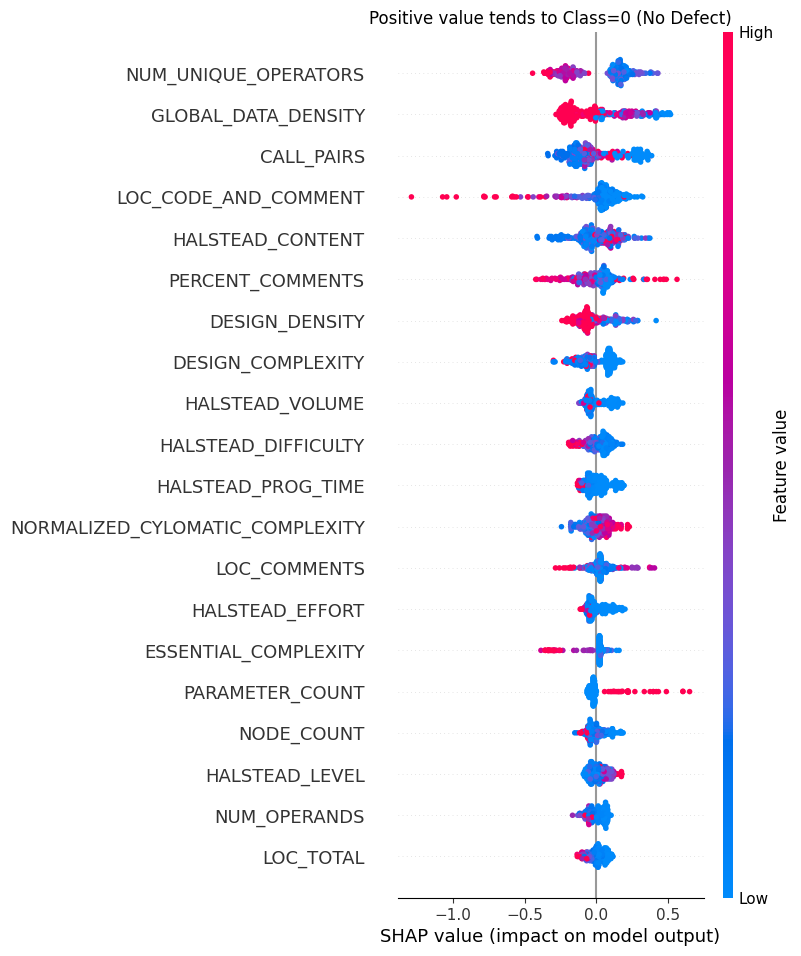

In [90]:
df = pd.read_csv("PC5.csv")
df.columns = df.columns.str.replace('Defective', 'c')
df['c'] = df['c'].replace("Y", 1)
df['c'] = df['c'].replace("N", 0)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


Size of Dataset (327, 38)
Accuracy:86.550117 %


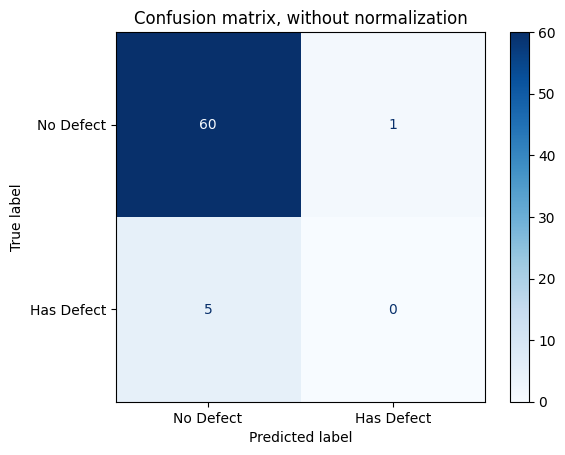

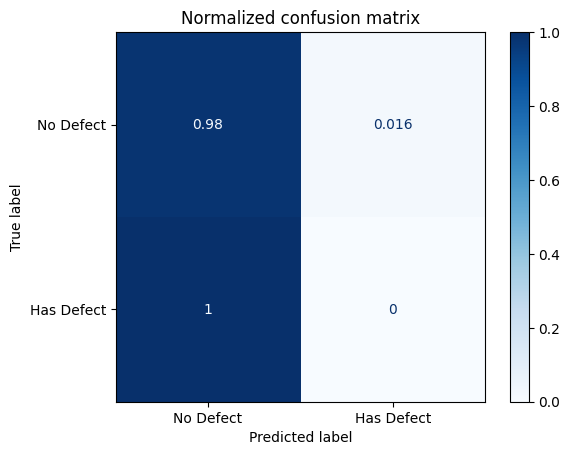

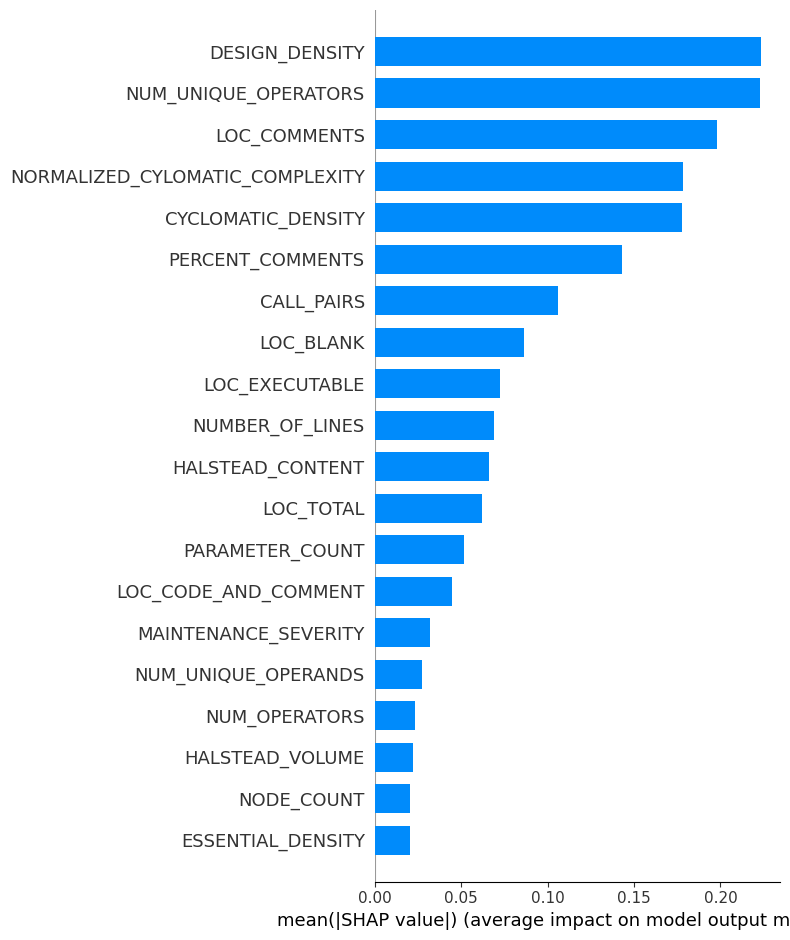

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


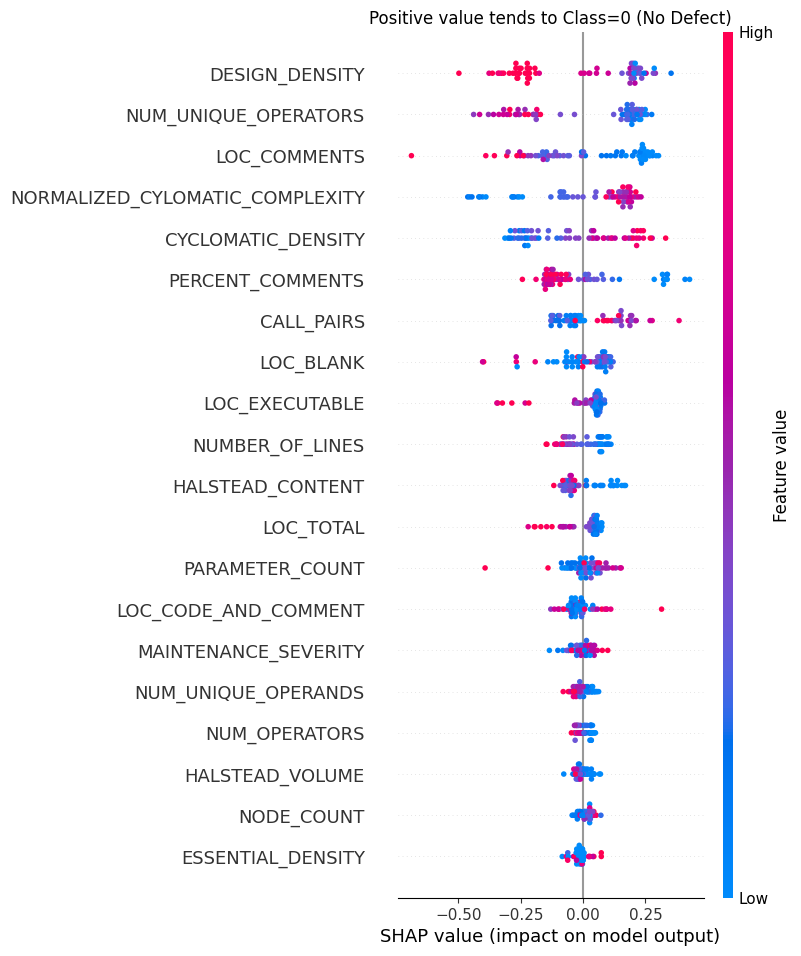

In [91]:
df = pd.read_csv("cm1.csv")
df.columns = df.columns.str.replace('Defective', 'c')
df['c'] = df['c'].replace("Y", 1)
df['c'] = df['c'].replace("N", 0)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


## SHAP on NASA (SOFTLAB) Datasets

Size of Dataset (121, 30)
Accuracy:92.566667 %


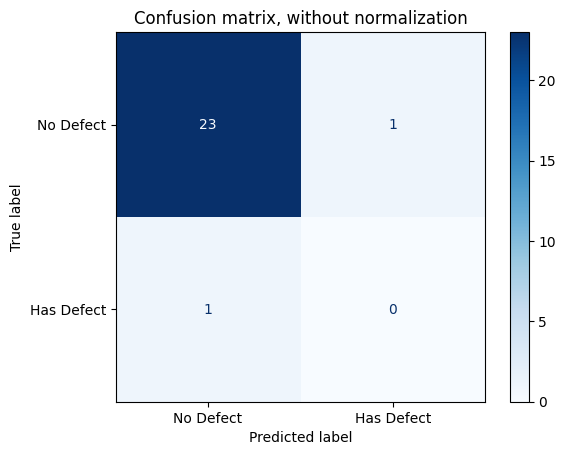

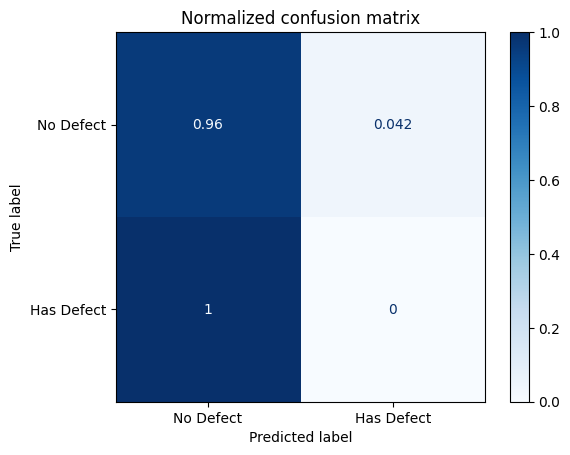

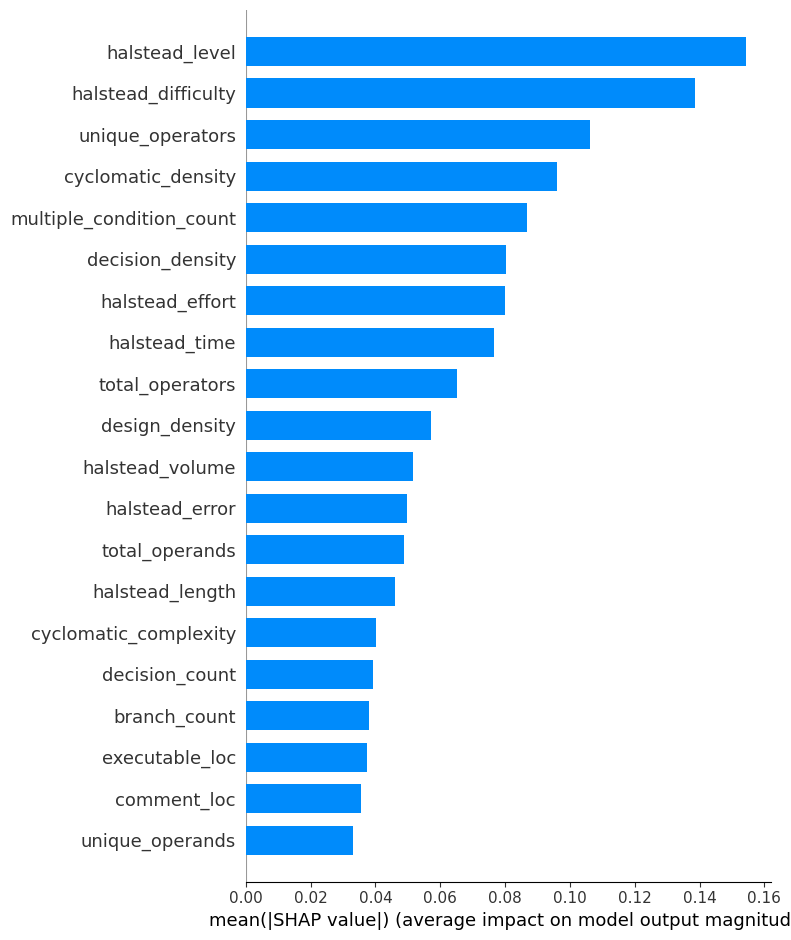

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


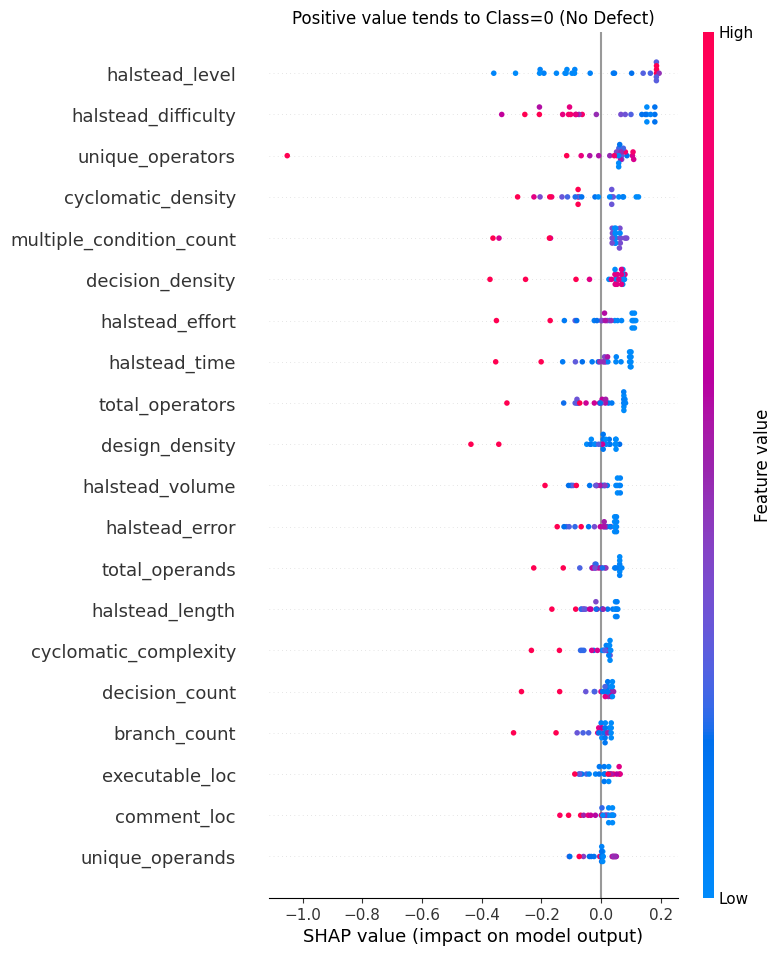

In [52]:
df = pd.read_csv("ar1.csv")
df.columns = df.columns.str.replace('defects', 'c')
df['c'] = df['c'].astype(int)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


Size of Dataset (63, 30)
Accuracy:90.641026 %


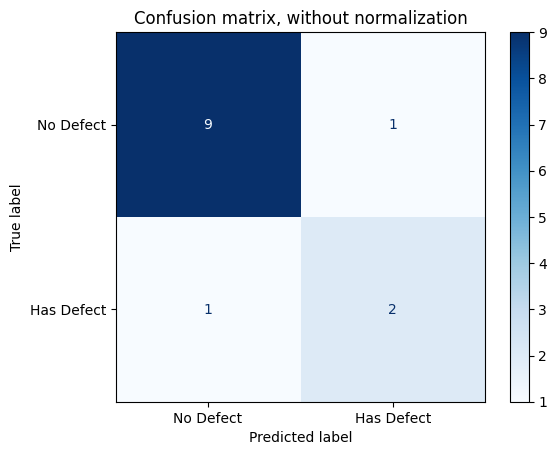

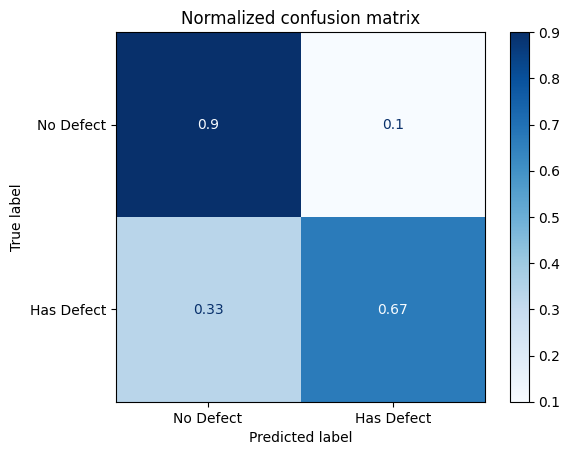

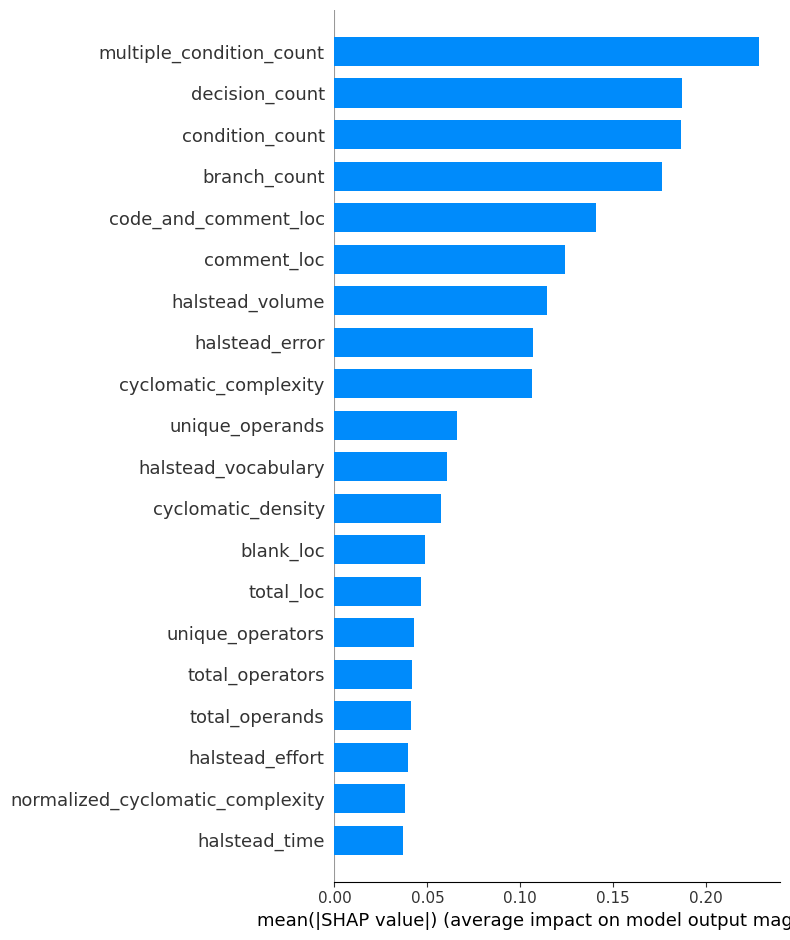

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


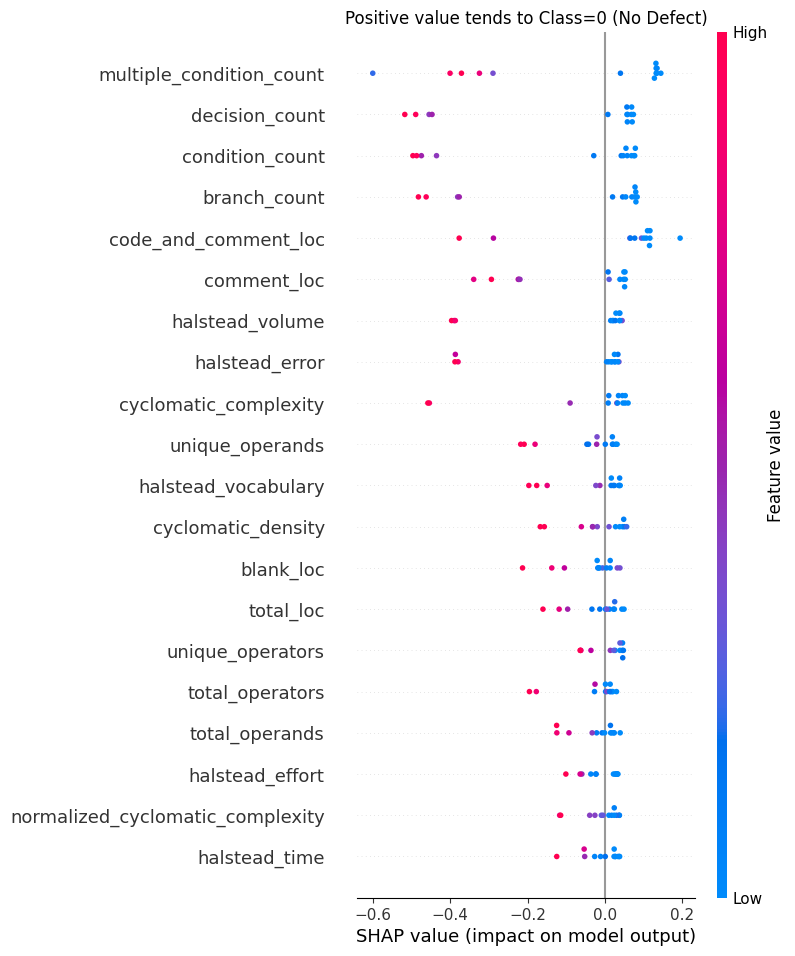

In [53]:
df = pd.read_csv("ar3.csv")
df.columns = df.columns.str.replace('defects', 'c')
df['c'] = df['c'].astype(int)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


Size of Dataset (107, 30)
Accuracy:82.251082 %


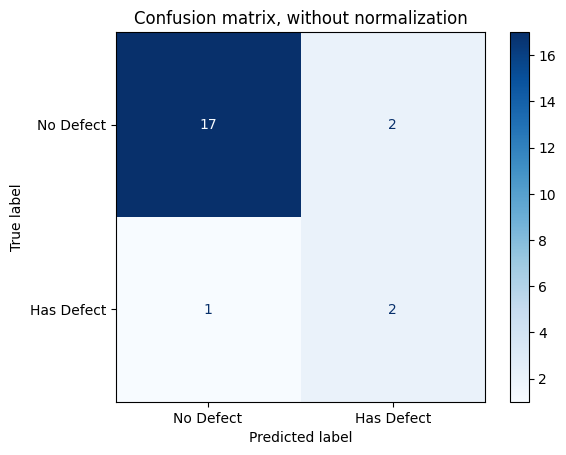

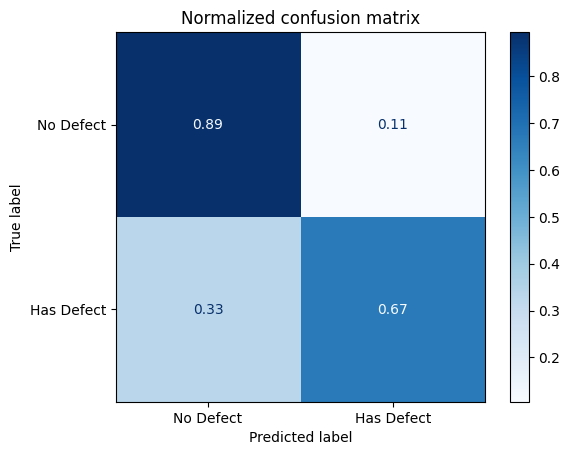

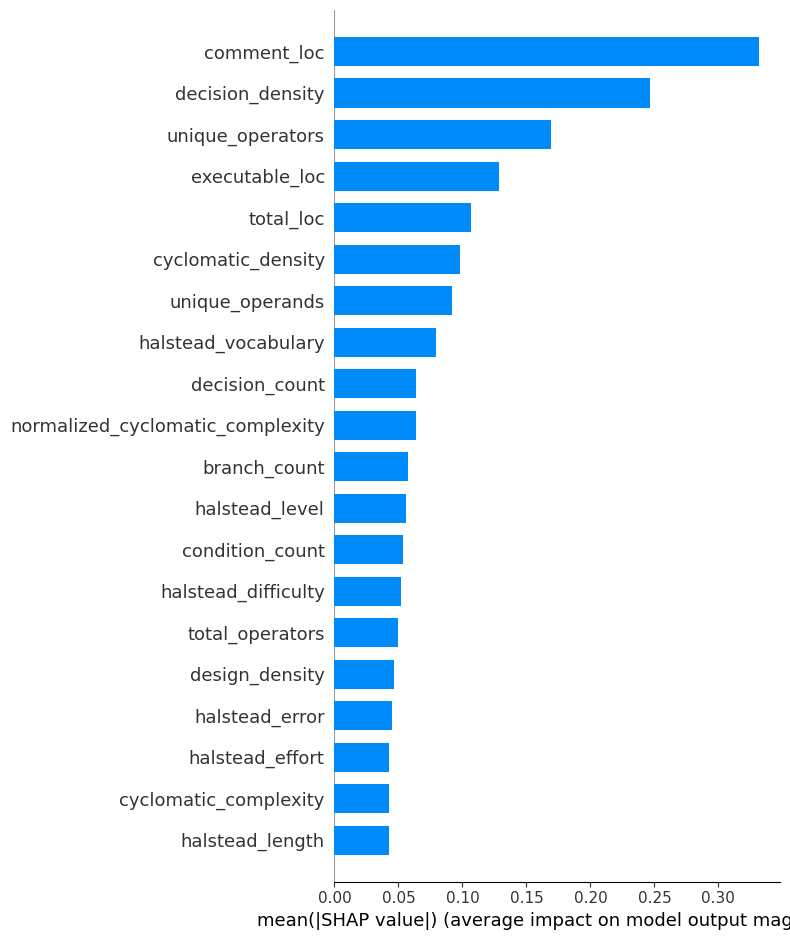

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


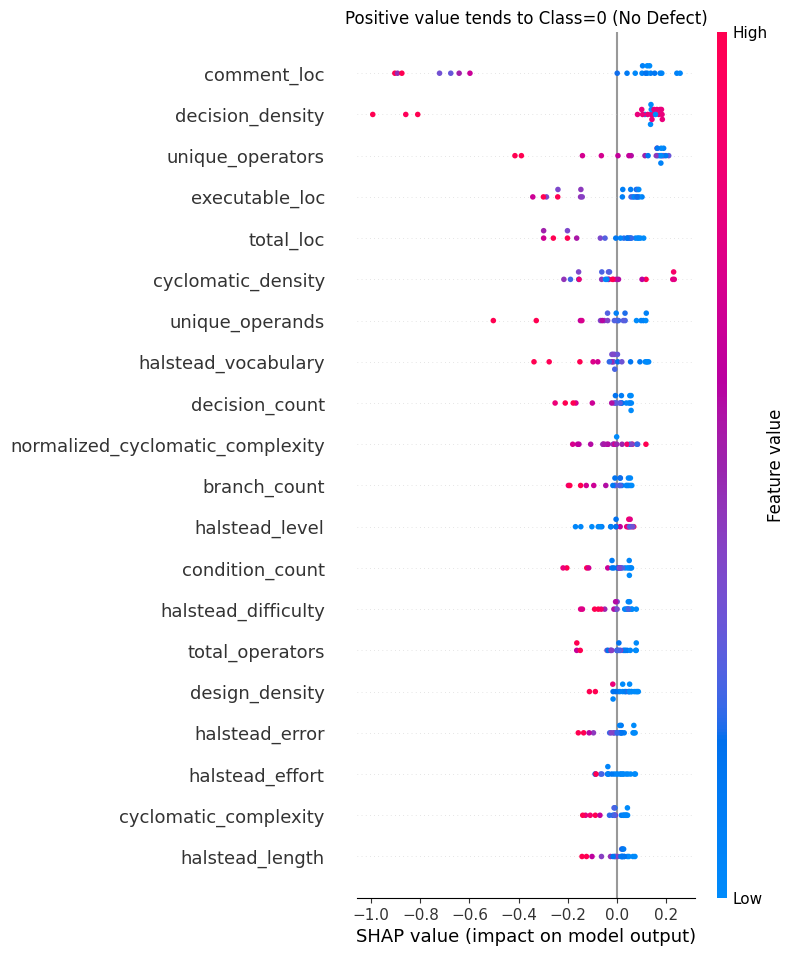

In [54]:
df = pd.read_csv("ar4.csv")
df.columns = df.columns.str.replace('defects', 'c')
df['c'] = df['c'].astype(int)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


Size of Dataset (36, 30)
Accuracy:82.857143 %


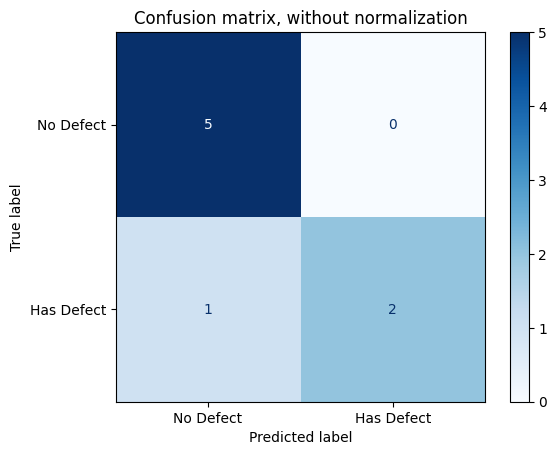

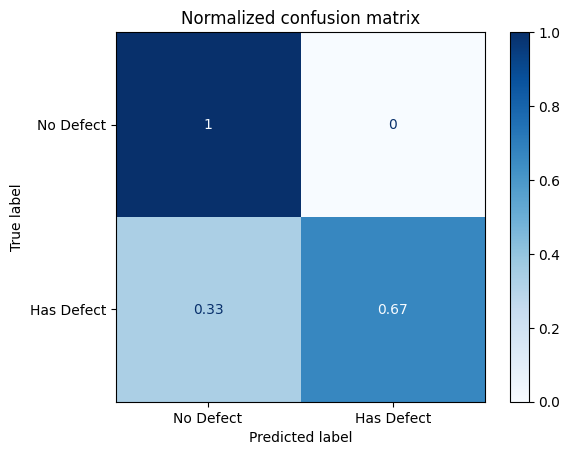

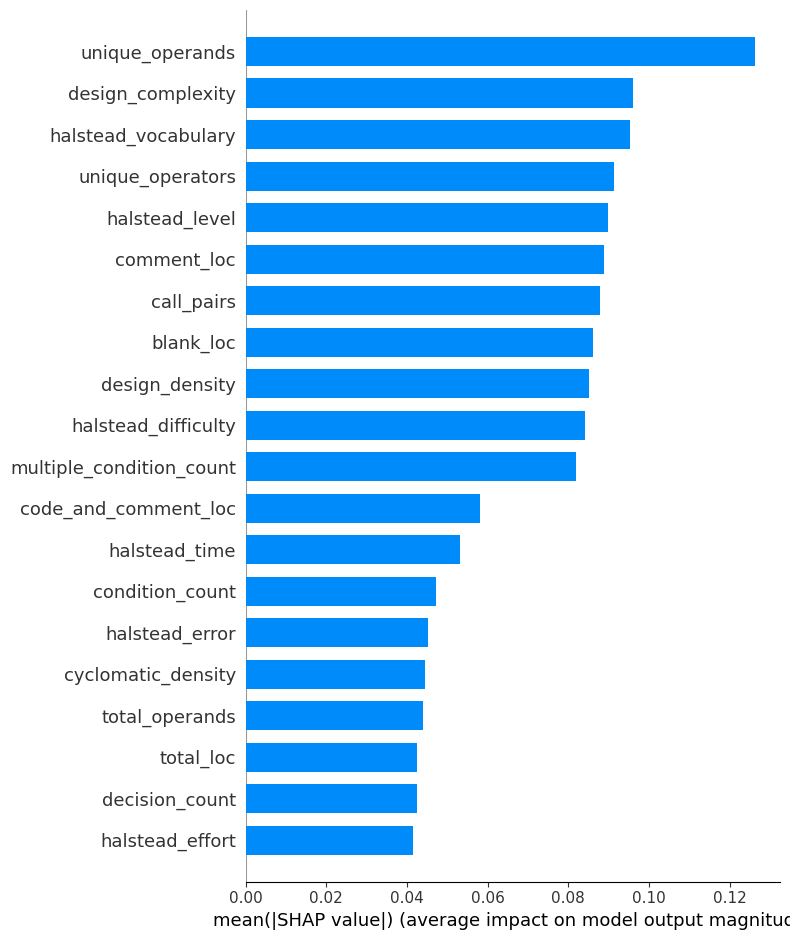

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


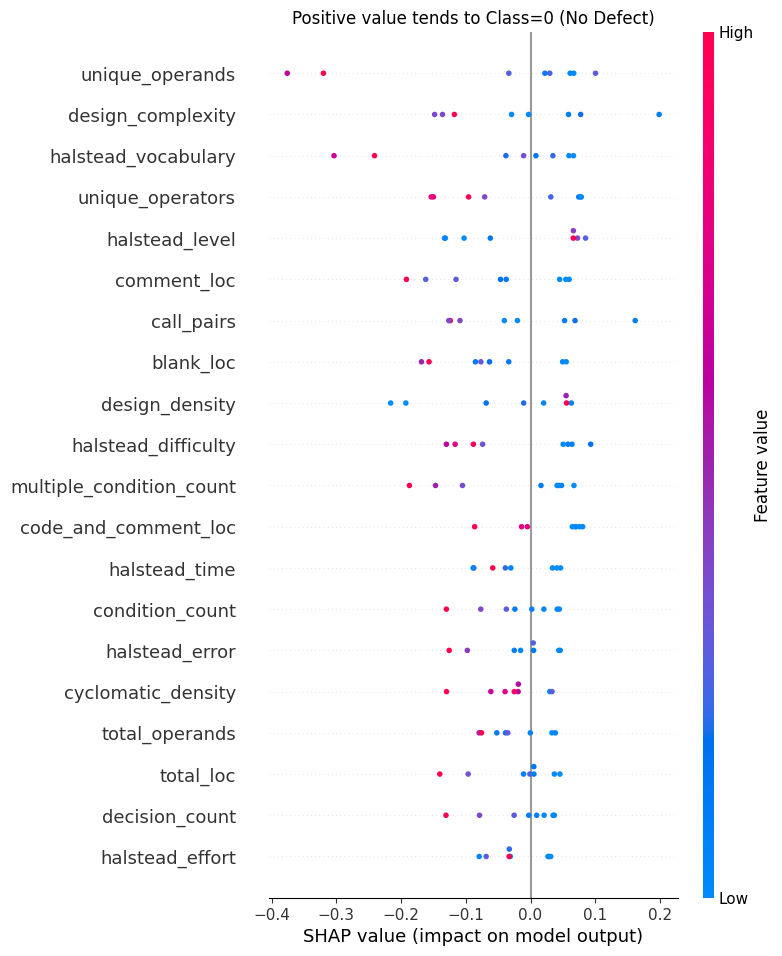

In [55]:
df = pd.read_csv("ar5.csv")
df.columns = df.columns.str.replace('defects', 'c')
df['c'] = df['c'].astype(int)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


Size of Dataset (101, 30)
Accuracy:85.190476 %


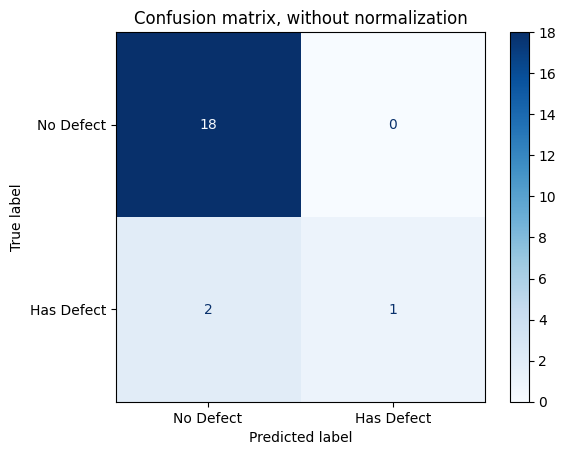

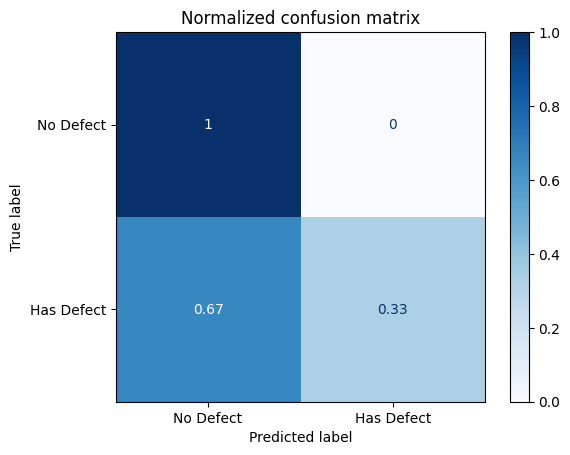

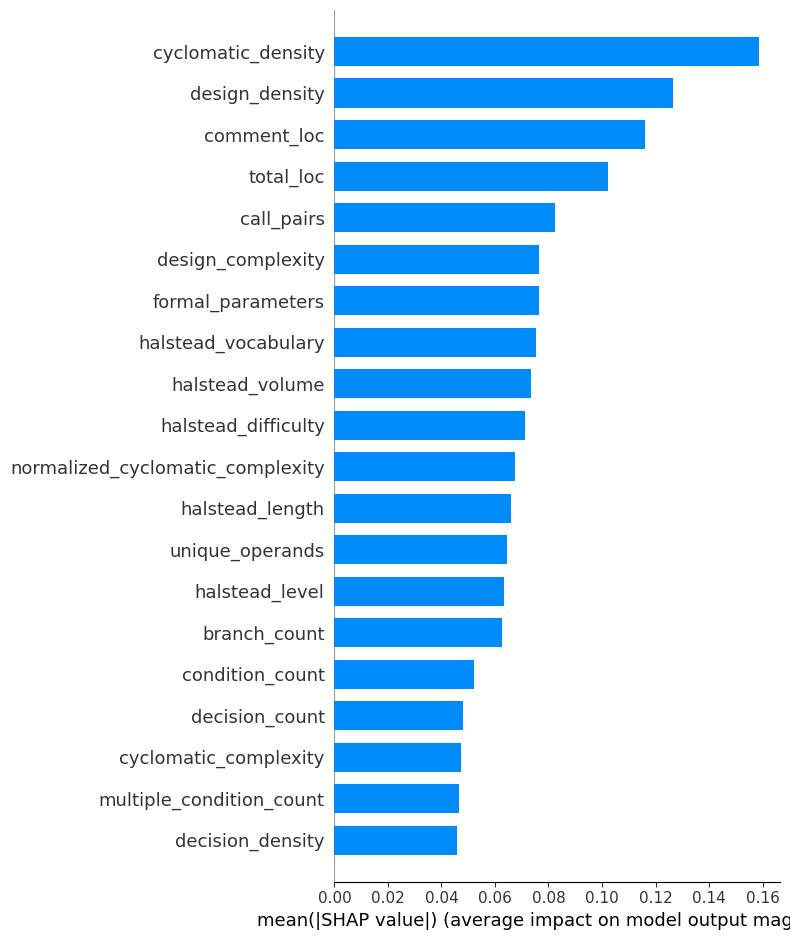

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


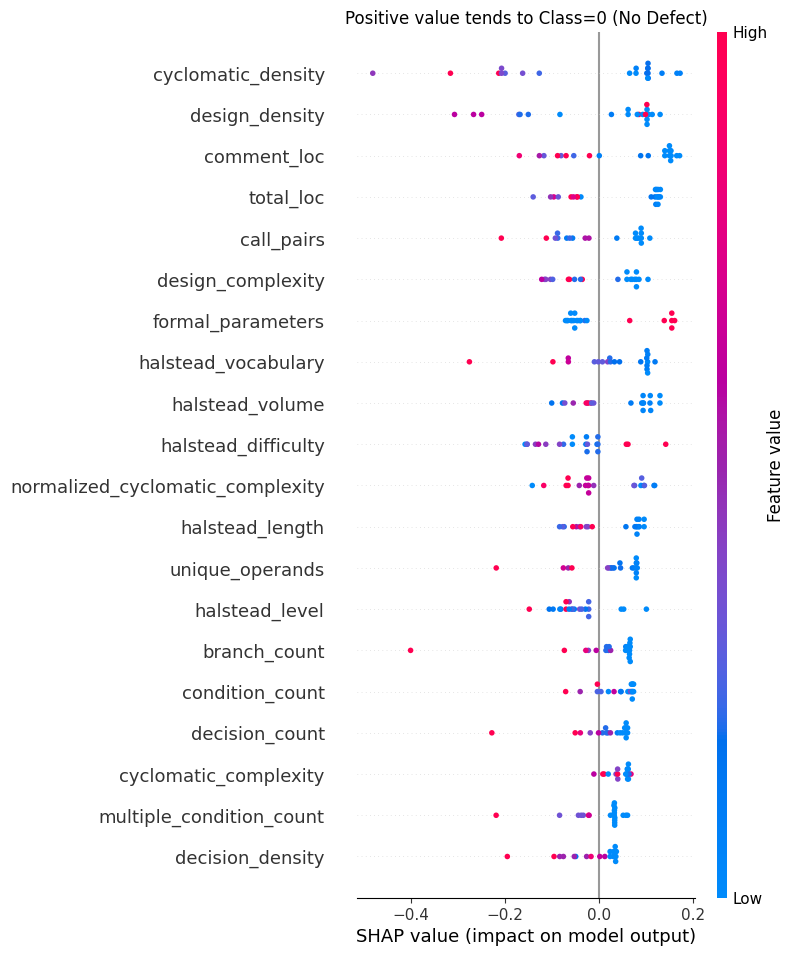

In [56]:
df = pd.read_csv("ar6.csv")
df.columns = df.columns.str.replace('defects', 'c')
df['c'] = df['c'].astype(int)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2, random_state=1)


params = {'iterations':1000,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)


accuracies = cross_val_score(estimator = cat_model, X = df[features], y = df[['c']], cv = 5)

print("Accuracy:{:.6f} %".format(accuracies.mean()*100))

titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        cat_model,
        X_test,
        y_test,
        display_labels=["No Defect","Has Defect"],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)


plt.show()

shap.initjs()
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values, X_test,plot_type = 'bar') #feature importance plot

shap_values_new = [-shap_values,shap_values]
shap.summary_plot(shap_values_new[0], X_test,show = False)  #summary plots for class=0(No Defect)
plt.title('Positive value tends to Class=0 (No Defect)') # the more positive the more it tends the prediction towards class=0
plt.show()

# for i in features:
#   shap.dependence_plot(i,shap_values,X_test)


### VERIFICATION OF SHAP

In [94]:
df = pd.read_csv("MC1.csv")
df.columns = df.columns.str.replace('Defective', 'c')
df['c'] = df['c'].replace("N", 0)
df['c'] = df['c'].replace("Y", 1)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2)


params = {'iterations':50,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)

y_pred = cat_model.predict(X_test)
# print(df)
print("Accuracy before change :{:.6f} %".format(accuracy_score(y_test , y_pred)*100))

for ind in df.index:
  df.loc[ind, 'PERCENT_COMMENTS'] = df.loc[1987 - ind, 'PERCENT_COMMENTS']


# print(df)
print(X_test['PERCENT_COMMENTS'])
X_test = df.iloc[X_test.index , :]
print(X_test['PERCENT_COMMENTS'])

y_pred = cat_model.predict(X_test)

print("Accuracy after change :{:.6f} %".format(accuracy_score(y_test , y_pred)*100))


Size of Dataset (1988, 39)
Accuracy before change :97.487437 %
716      0.00
689     27.27
754     50.00
326     66.67
521      0.00
        ...  
1136     0.00
842     32.65
1493     0.00
534     66.67
1810     0.00
Name: PERCENT_COMMENTS, Length: 398, dtype: float64
716     50.50
689     73.44
754     78.95
326     17.14
521     37.50
        ...  
1136     0.00
842      6.25
1493     0.00
534      0.00
1810     0.00
Name: PERCENT_COMMENTS, Length: 398, dtype: float64
Accuracy after change :96.984925 %


In [107]:
df = pd.read_csv("MC1.csv")
df.columns = df.columns.str.replace('Defective', 'c')
df['c'] = df['c'].replace("N", 0)
df['c'] = df['c'].replace("Y", 1)
df=df.drop(['id'], axis=1)

print(f"Size of Dataset {df.shape}")

features = [feat for feat in list(df) 
            if feat != 'c']
# print(features)

X_train, X_test, y_train, y_test = train_test_split(df[features], df[['c']], test_size=0.2)


params = {'iterations':50,'verbose':False}


cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train)

y_pred = cat_model.predict(X_test)
# print(df)
print("Accuracy before change :{:.6f} %".format(accuracy_score(y_test , y_pred)*100))

mn = np.mean(df['MULTIPLE_CONDITION_COUNT'])
for ind in df.index:
  df.loc[ind, 'MULTIPLE_CONDITION_COUNT'] = df.loc[1987 - ind, 'MULTIPLE_CONDITION_COUNT']


print(X_test['MULTIPLE_CONDITION_COUNT'])
X_test = df.iloc[X_test.index , :]
print(X_test['MULTIPLE_CONDITION_COUNT'])


y_pred = cat_model.predict(X_test)

print("Accuracy after change :{:.6f} %".format(accuracy_score(y_test , y_pred)*100))


Size of Dataset (1988, 39)
Accuracy before change :96.733668 %
1586     2
1642     0
139     10
1359     8
38       0
        ..
837      0
959      0
849      2
928      0
183      2
Name: MULTIPLE_CONDITION_COUNT, Length: 398, dtype: int64
1586    2
1642    0
139     0
1359    8
38      0
       ..
837     0
959     0
849     2
928     6
183     2
Name: MULTIPLE_CONDITION_COUNT, Length: 398, dtype: int64
Accuracy after change :96.482412 %
